# DATA SCIENCE PROJECT ON FIFA20 PREDICTION


**TEAM CODE:** PTID-CDS-SEP-22-1377

**PROJECT CODE:** PRCP-1004-Fifa20

**DATA COLLECTION:** DATA PROVIDED BY DATAMITES FOR CAPSTONE PROJECT

# BUISNESS CASE :-  WITH THE FIFA20 DATASET WE NEED TO CLUSTER THE PLAYER BY THEIR SKILL INTO CERTAIN GROUP

## IMPORT NECESSARY LIBRARY

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# to avoid warning
import warnings
warnings.filterwarnings("ignore")

## LOADING DATA

In [2]:
data = pd.read_csv("players_20.csv")

In [3]:
pd.set_option('display.max_columns',None)
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

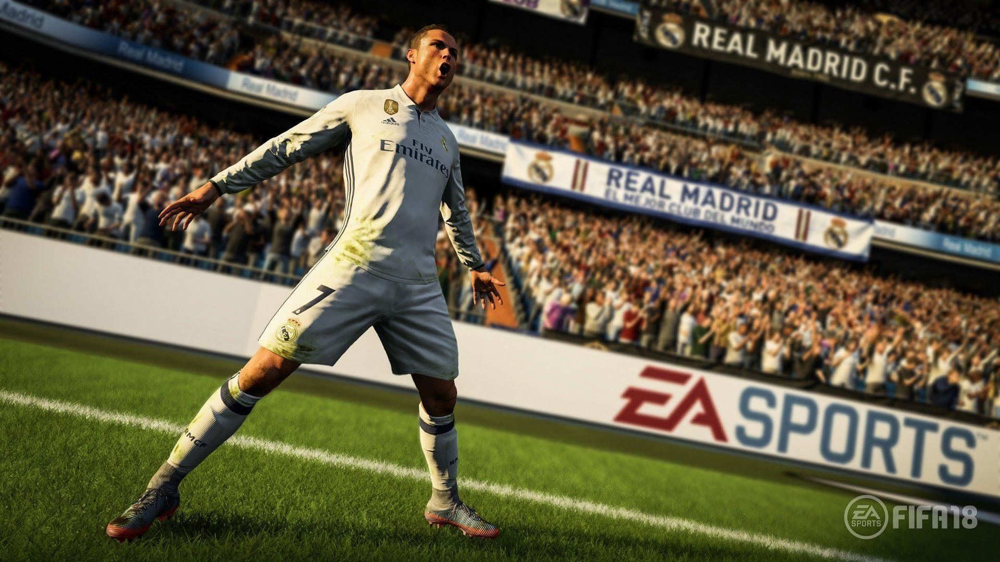

## DOMAIN ANALYSIS

**FIFA 20 Football is arguably the most popular sport in the world and FIFA is the most popular football (soccer) simulation game by Electronic Arts (EA Sports).**

### Introduction Of Dataset :-

**Sofifa-Id :-** 
   *  Id of fifa20 player.

**Player Url :-**
* A URL (Uniform Resource Locator) is a unique identifier used to locate a resource on the Internet. It is also referred to as a web address.

**Short Name :-**
* Short or nick name name of player.

**Long Name :-**
* Full name of palyer.

**age :-**
* Age in years.

**DOB :-**
* Date of birth of player.

**Height (cm) :-**
* Player height in centimeter.

**Weight (kg) :-**
* Player body wight.

**Nationality :-**
* Nationality is the legal status, which represents the country from which an individual belongs.

**Club :-**
* A group of people formed for the purpose of playing sports.

**Overall :-**
* The OVR (Overall) is made up of all the player's ingame stats.

**Potential :-**
* The potential rating, is the rating they will achieve for sure during the FIFA 20 career mode.



**Value Eur :-**
* The value of palyer in euro.



**Wage Eur :-**
* A living wage is the amount of income needed to provide an player with a basic but socially acceptable standard of living.



**Player positions :-**
* Positions indicate approximately where each player should be lined up prior to the start of a play.



**Prefeered Foot :-**
* Footedness may refer to the foot a player uses to kick with the greatest force and skill.



**International Reputation :-**
* International reputation is rated with 1-5 stars.



**Weak Foot :-**
* A player's foot (left or right) that is weaker than their preferred foot. A player's attribute rated between 1 to 5 which specifies the shot power and ball control for the other foot of that player than his preferred foot's.



**Skill Moves :-**
* skill moves, it is assigned a number between 1 (least complex) and 5 (most complex). Players with higher skills are able to perform more complex moves.



**Work Rate :-**
* work rates are how hard the player works on each end of the field.



**Body Type :-**
* A custom body type and character of football payer.



**Real Face :-**
* Face scan of real football palyer if it 'yes' then the character is look super realistic.



**Release Clause Eur :-**
* A release clause is the minimum amount of money you're willing to accept for that player.



**Player Tags :-**
* The tages of player is identified the palyer skills,like [Dribbler, Distance shooter, Crosser, Speedster].



**Team Position :-**
* The player’s positioning on the field.

**Team Jersey Number :-**
* The player’s positioning on the field.



**Loned From :-**
* It's a temporary restriction placed on player due to their club being short of players.



**Joined :-**
* Joining date of club.



**Contract Valid Until :-**
* The end year of contract of players.



**Nation Position :-**
* Nation position is similar to the team position of players.



**Nation Jersey Number :-**
* Jersey number of player.



**Pace :-**
* Fastest pace of player,striker or winger.



**Shooting :-**
* shooting is hitting the ball in an attempt to score a goal. It is usually done using the feet or head.



**Passing :-**
* The purpose of passing is to keep possession of the ball by maneuvering it on the ground between different players with the objective of advancing it up the playing field.



**Dribling :-**
* Dribbling Is Maneuvering A Ball By One Player While Moving In A Given Direction, Avoiding Problems’ Attempts To Intercept The Ball.



**Defending :-**
* Defending is most relate to the defender to stop the attack.



**Physic :-**
* physic in player means intensity and their effort.



**GK Diving :-**
* Goal keeper diving to save a shot.



**GK Handling :-**
* As a goalkeeper, you are allowed to handle the ball with your hands within your penalty area.



**GK Kicking :-**
* The goalkeeper is the player who usually kicks the ball to resume play, and they either kick it short to a teammate or it is kicked extremely hard to travel a long distance.



**GK Reflex :-**
* Ability to react quickly.



**GK Speed :-**
* Spped of goal keeper.



**GK Positioning :-/**
* Position of goal keeper is around only goal posts.



**Player Traits :-**
* A player’s traits are actions that he will be more likely to perform in matches.



**Attacking Crossing :-**
* The aim of a cross is to create the easiest possible scenario for the attacking player to score a goal.



**Attacking Finishing :-**
* Create a attack on field to score a goal.



**Attacking Heading Accuracy :-**
* One of the fundamental principles of the attacking header is to head the ball downwards.



**Attacking Short Passing :-**
* Short passes of ball to score a goal.



**Attacking Volleys :-**
* A volley is an air-borne strike in association football, where a player's foot meets and directs the ball in an angled direction before it has time to reach the ground.



**Skill Dribbling :-**
* The score of dribbling skill with football.



**Skill Curve :-**
* The curve of football at the time of goal.



**Skill Fk Accuracy :-**
* It stands for field goal. It is when a player kicks a ball through the uprights from a set distance.



**Skill Long Passing :-**
* The long passing skill score of the player.

**Skill Ball Control :-**
* The ball control of the player at playing time.



**Movement Accerlation :-**
* how quickly player can increase your velocity towards maximum speed.



**Movement Sprint Spped :-**
* Sprinting speed score of the player.



**Movement Agility :-**
* Agility is the ability to move quickly and easily, including moving in different directions without losing balance.



**Movement Reaction :-**
* The score of the quick reation of player.



**Movement Balance :-**
* Balance is the ability to control your body in its own space.



**Shot Power :-**
* power generate to score a goal.



**Power Jumping :-**
* The jumping ability of the player on field.



**Power Stamina :-**
* Stamina of player on filed.



**Power Strength :-**
* Strength of player on field.



**Power Long Shot :-**
* Total no of power long shot of football.



**Mentality Aggression :-**
* aggression is a characteristic that can have many negative as well as positive effects on performance of player.



**Mentality Interception :-**
* interception is thrown the possession of the ball is given to the other team.



**Mentality Positioning :-**
* The mentality positioning of player determines how defensive or attacking your players set out to play.



**Mentality Vision :-**
* The vision/mindset of player on filed.



**Mentalities Penalties :-**
* when a player commits an infraction against the rules of the game a foul will be called and a penalty will be assessed.



**Mentality Composure :-**
* composure stand for: Recognize–Regroup–Refocus. The first step is to Recognize that you are dwelling on the mistake, which limits your ability focus on the next play.



**Defending Making :-**
* when your team is defending, you want to make the field small and the options of the other team limited.



**Defending Standing Tackle :-**
* Defending standing Tackle of the player to get a ball on filed.



**Defending Sliding Tackle :-**
* Defending sliding tackle of player to get a ball.



**Goalkeeping Diving :-**
* Goal keeper diving to save a goal.



**Goalkeeping Handling :-**
* handle the ball with your hands within your penalty area.



**Goalkeeping Kicking :-**
* A kick taken by the goalkeeper when the attacking team has kicked the ball over the goal line.



**Goalkeeping Positioning :-**
* A Positioning of player to save the goal.



**Goalkeeping Reflex :-**
* The reflex of goalkeeper and players.



### Football Position Score :-

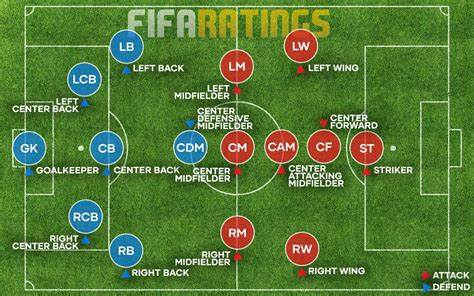

**LS :-**
* Long snapper or left striker.



**ST :-**
* Striker.

**RS :-**
* Right striker.



**LW :-**
*  Left sided wingers.



**LF :-**
* Left forword.

**CF :-**
* Center forword.

**RF :-**
* Right forword.

**RW :-**
* The RW is usually on the right end of the attacking trident, with the Striker and Left Winger, which mainly contributes to the team in terms of goals and assists.



**LAM :-**
* Left attacking midfield.

**CAM :-**
* Center attacking midfield.

**RAM :-**
* Right attacking midfield.

**LM :-**
* Left midfield.

**LCM :-**
* Left Center midfield.

**CM :-**
* Center midfield.

**RCM :-**
* Right Center midfield.

**RM :-**
* Right midfield.

**LWB :-**
* Left Wing back.

**LDM :-**
* Left defensive midfield.

**CDM :-**
* Center defensive midfield.

**RDM :-**
* Right defensive midfield.

**RWB :-**
* Right wing back.

**LB :-**
* Left back.

**LCB :-**
* Left Center black.

**CB :-**
* Center black.

**RCB :-**
* Right center black.

**RB :-**
* Right black.





## BASIC CHECKS

In [4]:

data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

In [5]:
data.tail()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,48,56,40000,2000,CB,Right,1,3,2,Medium/High,Normal,No,70000.0,NaN,RES,36.0,NaN,2018-07-13,2019.0,NaN,NaN,57.0,23.0,28.0,33.0,47.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,17,40,35,27,24,23,21,28,35,56,58,45,40,73,36,70,60,47,16,46,48,28,25,39,41,45,50,52,5,5,13,5,14,32+2,32+2,32+2,31+2,31+2,31+2,31+2,31+2,31+2,31+2,31+2,33+2,33+2,33+2,33+2,33+2,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,48,56,40000,2000,CB,Right,1,2,2,Medium/Medium,Normal,No,72000.0,NaN,SUB,31.0,NaN,2019-02-01,2022.0,NaN,NaN,58.0,24.0,33.0,35.0,48.0,48.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,20,42,43,28,32,24,29,39,31,55,61,43,41,76,33,72,55,44,20,42,49,23,25,37,35,42,53,57,13,6,14,11,9,33+2,33+2,33+2,33+2,32+2,32+2,32+2,33+2,33+2,33+2,33+2,35+2,36+2,36+2,36+2,35+2,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,48,56,40000,1000,CM,Right,1,2,2,Low/Medium,Lean,No,70000.0,NaN,SUB,38.0,NaN,2019-01-01,2019.0,NaN,NaN,54.0,35.0,44.0,45.0,48.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32,33,49,53,32,40,32,32,55,49,55,54,52,52,57,48,60,50,51,26,50,45,38,38,36,39,46,52,46,7,8,10,6,14,43+2,43+2,43+2,43+2,43+2,43+2,43+2,43+2,44+2,44+2,44+2,45+2,46+2,46+2,46+2,45+2,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,48,54,40000,1000,CM,Right,1,2,2,Low/Low,Lean,No,70000.0,NaN,SUB,33.0,NaN,2019-02-01,2022.0,NaN,NaN,59.0,35.0,47.0,47.0,45.0,52.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39,34,47,54,28,42,37,39,48,49,55,63,55,54,59,46,61,42,55,28,57,49,31,48,36,40,39,44,54,14,9,13,13,13,43+2,43+2,43+2,45+2,44+2,44+2,44+2,45+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2
18277,233449,https://sofifa.com/player/233449/ximing-pan/20...,Pan Ximing,潘喜明,26,1993-01-11,182,78,China PR,Hebei China Fortune FC,48,51,40000,2000,CM,Right,1,3,2,Medium/Medium,Normal,No,NaN,NaN,SUB,37.0,Tianjin TEDA FC,NaN,2019.0,NaN,NaN,60.0,32.0,51.0,45.0,47.0,55.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,30,48,58,25,40,34,35,52,46,54,64,52,49,71,41,64,40,61,30,54,47,29,52,38,42,52,42,48,8,12,14,9,10,42+2,42+2,42+2,44+2,43+2,43+2,43+2,44+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,48+2,49+2,49+2,49+2,48+2,48+2,50+2,50+2,50+2,48+2


In [6]:
data.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=104)

In [7]:
data.shape

(18278, 104)

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


**In this all type of data is available in dataset. Ex.,(float64 = 45; int64 = 45; object = 43)** 

## STATISTICAL MEASURES OF DATA

In [9]:
data.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.

In [10]:
data.describe(include="O")

,player_url,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,real_face,player_tags,team_position,loaned_from,joined,nation_position,player_traits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,1499,18038,1048,16990,1126,7566,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,6142,162,698,643,2,9,10,2,83,29,316,1760,26,921,94,94,94,107,103,103,103,107,103,103,103,100,88,88,88,100,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,No,#Strength,SUB,Sassuolo,2019-07-01,SUB,Early Crosser,61+2,61+2,61+2,63+2,63+2,63+2,63+2,63+2,61+2,61+2,61+2,61+2,58+2,58+2,58+2,61+2,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,113,1667,33,2322,13960,9875,10750,16310,514,7820,17,1465,587,501,725,725,725,736,727,727,727,736,748,748,748,809,775,775,775,809,682,636,636,636,682,667,621,621,621,667


**In this data and Categorical data NO constant column is available.** 

# EXPLOTARY DATA ANALYSIS 

## Remove the special character and split the string

In [11]:
data = data.replace('[/#]','',regex=True)

In [12]:
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https:sofifa.complayer158023lionel-messi20159586,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,MediumLow,Messi,Yes,195800000.0,"Dribbler, Distance Shooter, Crosser, FK Specia...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https:sofifa.complayer20801c-ronaldo-dos-santo...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,HighLow,C. Ronaldo,Yes,96500000.0,"Speedster, Dribbler, Distance Shooter, Acrobat...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https:sofifa.complayer190871neymar-da-silva-sa...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,HighMedium,Neymar,Yes,195200000.0,"Speedster, Dribbler, Playmaker , Crosser, FK ...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https:sofifa.complayer200389jan-oblak20159586,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,MediumMedium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https:sofifa.complayer183277eden-hazard20159586,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,HighMedium,Normal,Yes,184500000.0,"Speedster, Dribbler, Acrobat",LW,7.0,NaN,2019-07-01,2024.0,LF,10.0,

In [13]:
postion_columns = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm',
           'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']

for col in postion_columns:
    data[col] = data[col].str.split('+',expand=True)[0]
data.head(2)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https:sofifa.complayer158023lionel-messi20159586,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,MediumLow,Messi,Yes,195800000.0,"Dribbler, Distance Shooter, Crosser, FK Specia...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,20801,https:sofifa.complayer20801c-ronaldo-dos-santo...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,HighLow,C. Ronaldo,Yes,96500000.0,"Speedster, Dribbler, Distance Shooter, Acrobat...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61


## Univariate Analysis

In [14]:
univariate_data =  data[[ 'age',  'height_cm', 'weight_kg','overall', 'potential', 'value_eur', 'wage_eur', 
                   'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type',
                   'real_face', 'release_clause_eur', 'player_tags', 'team_position', 'team_jersey_number', 
                   'contract_valid_until', 'nation_position', 'nation_jersey_number', 'pace', 'shooting', 'passing',
                   'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 
                   'gk_positioning','attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy',
                   'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 
                   'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 
                   'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 
                   'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
                   'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking',
                   'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 
                   'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'ls', 'st', 'rs', 'lw', 'lf', 
                   'cf', 'rf', 'rw', 'lam','cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb',
                   'lb', 'lcb', 'cb', 'rcb', 'rb']]

In [15]:
import sweetviz as sv
my_report = sv.analyze(univariate_data)
my_report.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Observations :-

**1. Age :-**
* The range of player age between 16 to 42 with the average of 25.3 .

**2. Height (cm) :-**
* The average height of pplayer is 181.4cm, maximum height is 205 and minimum height is 156cm.


**3. Weight (kg) :-**
* The range of weight of player between 50 to 110kg.


**4. Overall :-**
* The maximum score of stats is 94 and minimum is 48.0 with the average of 66.2 .

**5. Potential :-**
* The maximum score of player potential is 95.0 and minimum score of potential is 49.0 .

**6. Value Eur :-**
* The average value of player is 2.5million.
* Maximum value of player is 105.5 million.


**7. Wage Eur :-**
* The maximum living wage of player is 565k with the average of 9k.


**8. Prefeered Foot :-**
* 75% of player prefeered right foot.
* 25% of player prefeered left foot.


**9. International Reputation :-**
* The range of international reputation is 1 to 5.
* 92% of player rated with 1, 6% of player is rated with 2 and remaining player rated with 3,4,5 rating.


**10. Week Foot :-**
* A week foot is rated between 1 to 5.
* Most of week foot player rating is 3.

**11. Skill Moves :-**
* The skill moves range between 1 to 5.
* 2 skill moves is maximum in player as well as 36% is 3 and 11% is 1 skill moves.


**12. Work Rate :-**
* The maximum 54% count of work rate is medium then 18% is high/medium.


**13. Body Type :-**
* 59% player body type is normal.
* 36% player body type is lean.


**14. Real Face :-**
* 89% player face is not real and remaining 11% face is real in game.


**15. Release Clause Eur :-**
* The maximum release clasue of player is 165.8million with the average of 4.7 million.

**16. Player Tags :-**
* Strength, acrobat, engine, and speedster this tags is most in player tags.

**17. Team Position & Nation Position :-**
* The maximum 7280 is SUB, 2958 is RES team posistion.
* remaining all position is less than 5%.

**18. Team Jersey Number :-**
* The range of team jersey number is 1 to 99.
* Maximum team jersey number between 1 to 40.


**19. Contract Valid Until :-**
* Most of the player contract valid until 2020, 23% player contract valid until 2021.
* The range of contract year between 2019 to 2026.


**20. Nation Jersey Number :-**
* The range of nation jersey number between 1 to 30.
* Most of the jersey no between 1 to 20.


**21. Pace :-**
* The most of the pace of player between 60 to 80.


**22. Shooting :-**
* The range of shooting score between 15 to 93, Most number of shooting score around 25 to 70.

**23. Passing :-**
* The range of passing score of the player is 24 to 92 with the average 57.2.


**24. Dribbling :-**
* The most no of dribbling score between 50 to 80.


**25. Deffending :-**
* The range of defending between 15 to 90.the Most no of defending score between 50 to 70.


**26. Physic :-**
* The physic score range between 27.0 to 90.0 the most no of physcore between 60 to 80.

**27. Gk Diving :-**
* Most no of score of gk diving between 60 to 70.
* The range of gk diving between 44 to 90.


**28. GK Handling :-**
* The most observation of gk handling between 60 to 70, maximum score is 92 and minimum score is 42.

**29. GK Kicking :-**
* The range of gk kicking in between 35.0 to 93.0 with the average of 61.8.


**30. GK Reflex :-**
* Most of the gk reflex between 60 to 70.


**31. GK Speed :-**
* The highest speed of of gk is 65.0, most no of gk speed between 25 to 50.

**32. GK Positioning :-**
* Most gk positioning score is 65 and maximum score is 91 as well as minimum score is 41.

**33. Attacking Crossing :-**
* The attacking crossing range between 5 to 93, the most observation of attacking passing between 50 to 70.

**34. Attacking Finishing :-**
* Most of the attacking finishing is 60,Maximum 95 and minimum 2 attacking finishing.


**35. Attacking Heading Accuracy :-**
* Heading accuracy range between 5 to 93,most observation of attacking heading accuracy between 50 to 60.

**36. Attacking Short Passing :-**
* most observation of attacking short passing between 60 to 70.

**37. Attacking Volleys :-**
* most observation of attacking volleys between 30 to 70 with the average of 42.8.


**38. Skill Dribbling :-**
* most observation of skill dribbling is 65.
* The range of skill dribbling between 4 to 97.

**39. Skill Curve :-**
* The most observation of skill curve between 40 to 70, maximum score is 94 and minimum score is 6.

**40. Skill FK Accuracy :-**
* The maximum accuracy is 94 and minimum accuracy is 4 with the average of 42.7 .

**41. Skill Long Passing :-**
* The most observation of skill long passing between 50 to 60, maximum score is 92 and minimum score is 8.

**42. Skill Ball Control :-**
* The maximum skill ball control is 96 and minimum skill ball control is 5 with the average of 58.5 .

**43. Movement Acceleration :-**
* The most observation of movement acceleration between 60 to 80, maximum score is 97 and minimum score is 12.

**44. Movement Sprint Speed :-**
* Maximum sprint speed is 96 and minimum sprint speed is 11 with the average of 64.4 .

**45. Movement Agility :-**
* Maximum movement agility is 96 and minimum movement agility is 11 with the average of 63.5 .

**46. Movement Reaction :-**
* Maximum movement reaction is 96 and minimum movement reaction is 21 with the average of 61.8 .

**47. Movement Balance :-**
* The range of movement balance is 12 to 97 with 64.9 average.


**48. Power Shot Power :-**
* Maximum shot power is 95 and minimum shot power is 14 with the average of 58.2 .

**49. Power Jumping :-**
* Maximum power jumping is 95 and minimum power jumping is 19 with the average of 64.9.

**50. Power Stamina :-**
* Maximum power stamina is 97 and minimum shot stamina is 12 with the average of 62.9 .

**51. Power Strength :-**
* Maximum power strength is 97 and minimum power strength is 20 with the average of 65.2 .

**52. Power Long Shot :-**
* Maximum power long shot is 94 and minimum power long shot is 4 with the average of 46.8 .

**53. Mentality Aggression :-**
* Maximum mentality aggression is 95 and minimum mentality aggression is 9 with the average of 55.7 .

**54. Mentality Interception :-**
* Maximum mentality interception is 93 and minimum mentality interception is 3 with the average of 46.3 .

**55. Mentality Positioning :-**
* Maximum mentality positioning is 95 and minimum mentality positioning is 2 with the average of 50.1 .

**56. Mentality Vision :-**
* Maximum mentality vision is 94 and minimum mentality vision is 9 with the average of 53.6 .

**57. Mentality Penalities :-**
* Maximum mentality penalties is 92 and minimum mentality penalties is 7 with the average of 48.7 .

**58. Mentality Composer :-**
* Maximum mentality composure is 96 and minimum mentality composure is 12 with the average of 58.5 .

**59. Defending Marking :-**
* Maximum defending marking is 94 and minimum defending marking is 1 with the average of 46.8 .

**60. Defending Standing Tackle :-**
* Maximum defending standing tackle is 92 and minimum defending standing tackle is 5 with the average of 47.6 .

**61. Defending Sliding Tackle :-**
* Maximum defending sliding tackle is 90 and minimum defending sliding tackle is 3 with the average of 45.6 .

**62. Goalkeeping Diving :-**
* Maximum goalkeeping diving is 90 and minimum goalkeeping diving is 1 with the average of 16.6 .

**63. Goalkeeping Handling :-**
* Maximum goalkeeping diving is 92 and minimum goalkeeping diving is 1 with the average of 16.4 .

**64. Goalkeeping Kicking :-**
* Maximum goalkeeping diving is 93 and minimum goalkeeping diving is 1 with the average of 16.2 .

**65. Goalkeeping Positioning :-**
* Maximum goalkeeping diving is 91 and minimum goalkeeping diving is 1 with the average of 16.4 .

**66. Goalkeeping Reflex :-**
* Maximum goalkeeping diving is 92 and minimum goalkeeping diving is 1 with the average of 16.7 .

**67. Player Positions :-
      [LS, ST, RS, LW, LF, CF, LF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB]**
 *  This all position scores are almost same as well as most of the observation range between 56 to 63.    

## Bivariate And Multivariate Analysis

### Analysis On Numerical Features :-

### 1. Impact Of Age To Movement Reaction :-

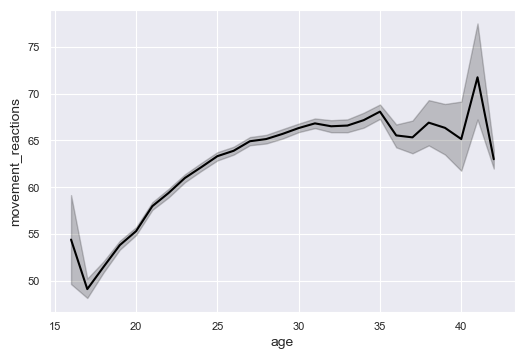

In [16]:
sns.set_style('darkgrid')
sns.lineplot(x='age',y='movement_reactions',data=data,color = "black" )
plt.show()

* At the age 15 to 20 movement raction is less.
* If player age is increasing player movement reaction also increasing.


### 2. Impact of Height To Weight :-

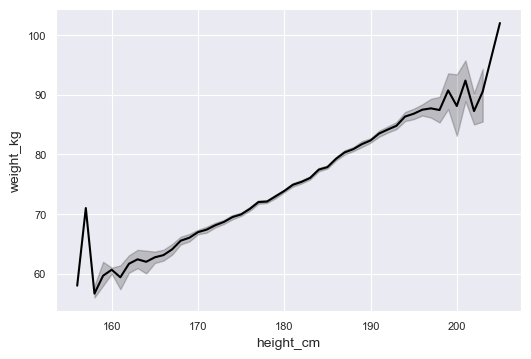

In [17]:
sns.lineplot(x='height_cm',y='weight_kg',data=data,color = "black")
plt.show()

* If the players height is increases player weight also increases.


### 3.Relation Between Overall And Potential With Respect To Preferred Foot :-

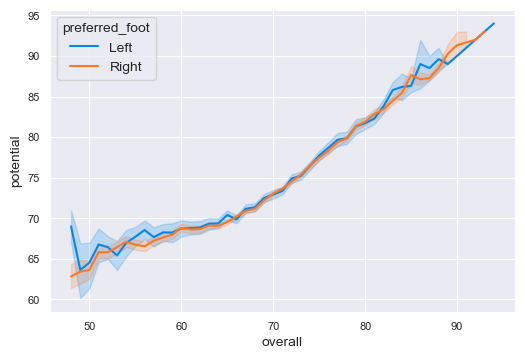

In [18]:
sns.lineplot(x='overall',y='potential',data=data,hue='preferred_foot')
plt.show()

* If the players overall score is increasing the score of potential also increasing with both foot.


### 4. Relation Between Value Eur And Wage Euro With Respect To Preferred Foot :-

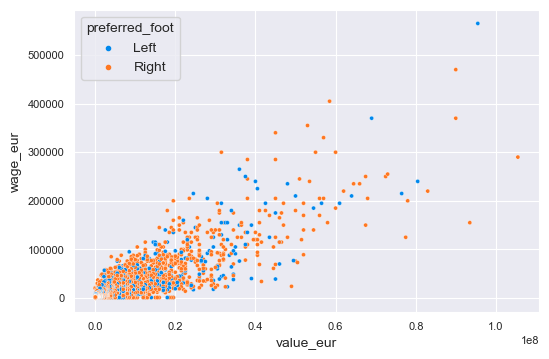

In [19]:
sns.scatterplot(x='value_eur',y='wage_eur',data=data,hue='preferred_foot')
plt.show()

* If player value is less then the wage of player also less.
* If the value of player is more the wage is silghtly more.


### 5. Impact Of Contract Valid Until To Release Clause Eur :-

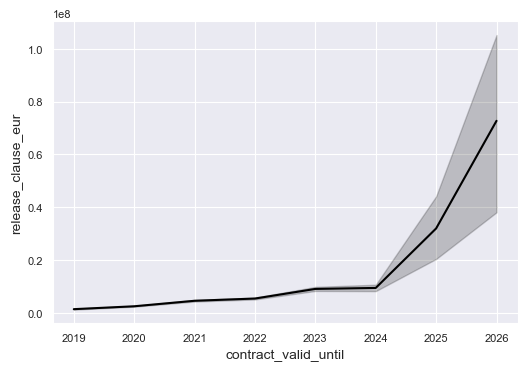

In [20]:
sns.lineplot(x='contract_valid_until',y='release_clause_eur',data=data,color='black')
plt.show()

* If player contract valid until 2024 to 2026 then the relase clause of player is more.
* If player contract valid until 2019 to 2024 then the release clause of player is less.


### 6. Relation Between Pace And Shooting With Respect To Preferred Foot :-

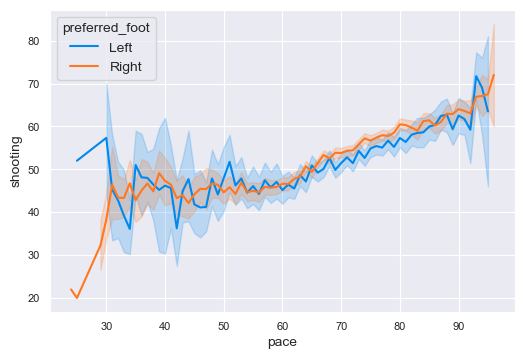

In [21]:
sns.lineplot(x='pace',y='shooting',data=data,color='black',hue='preferred_foot')
plt.show()

* If the player preferred left foot then the pace is less but shooting is around 50 to 60.
* If the player preferred right foot then the pace is less as well as shooting also less.


### 7. Impact Of Dribbling To Defending :-

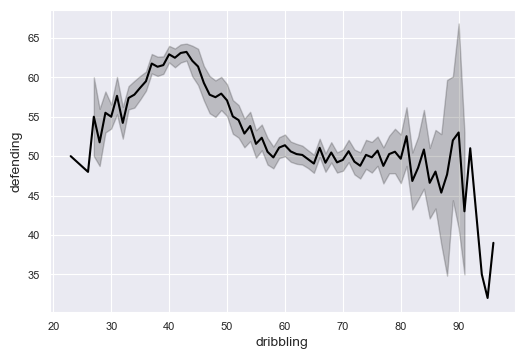

In [22]:
sns.lineplot(x='dribbling',y='defending',data=data,color='black')
plt.show()

* If the dribbling score is 30 to 50 then the defending score is high.
* If dribbling score is more then the defending score also less.


### 8. Impact Of Physic To Attacking Crossing :-

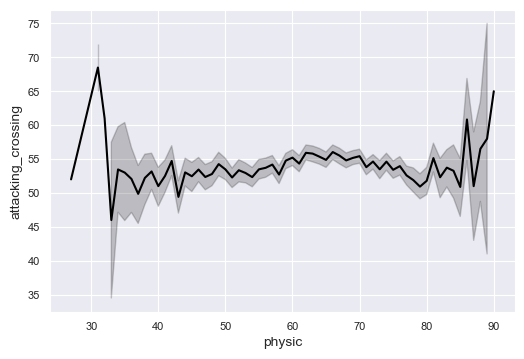

In [23]:
sns.lineplot(x='physic',y='attacking_crossing',data=data,color='black')
plt.show()

* If the physic is less then the attacking crossing is more.
* Otherwise physic range between 35 to 80 the attacking crossing is constant.


### 9. Impact Of GK Diving To GK Handling :-

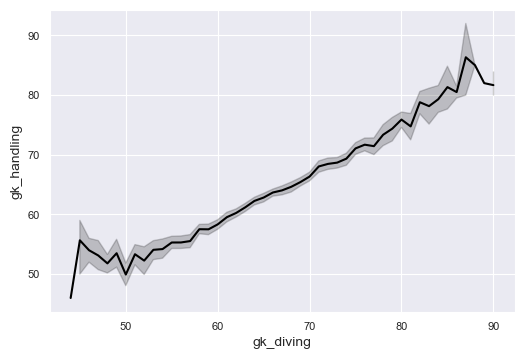

In [24]:
sns.lineplot(x='gk_diving',y='gk_handling',data=data,color='black')
plt.show()

* If the gk diving score is increases the gk handling score also increases.


### 10. Impact Of GK Relexes To GK Speed :-

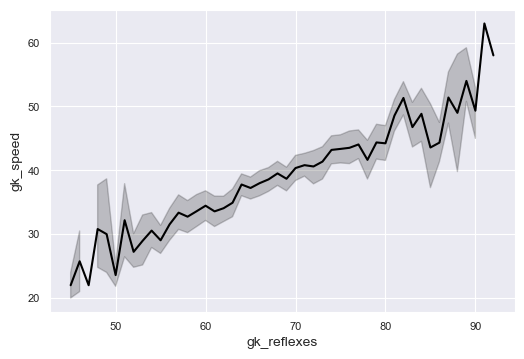

In [25]:
sns.lineplot(x='gk_reflexes',y='gk_speed',data=data,color='black')
plt.show()

* Less gk reflexes then the gk speed also less.
* More gk reflexes then the gk speed also more.


### 11. Impact Of GK Positioning To Gk Kicking :-

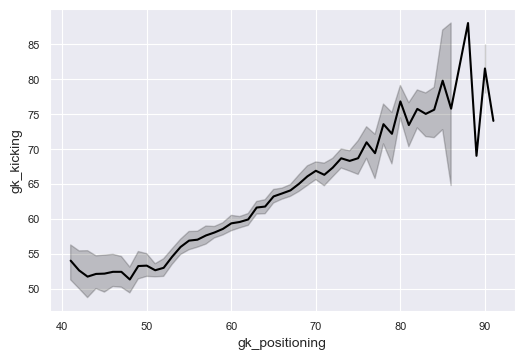

In [26]:
sns.lineplot(x='gk_positioning',y='gk_kicking',data=data,color='black')
plt.show()

* If the gk positioning score is less then the gk kicking score also less.
* If the gk positioning score is increases then the gk kicking score also increases.


### 12. Impact Of Attacking Crossing To Attacking Finishing  :-

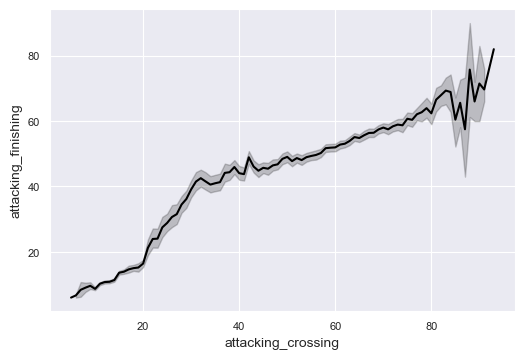

In [27]:
sns.lineplot(x='attacking_crossing',y='attacking_finishing',data=data,color='black')
plt.show()

* Attcking score between 20 to 40 then attacking finishing score around 40 to 50.
* Either attacking crossing is more then attacking finishing also more.


### 13. Impact Of Attacking Short Passing To Attacking Volleys :-

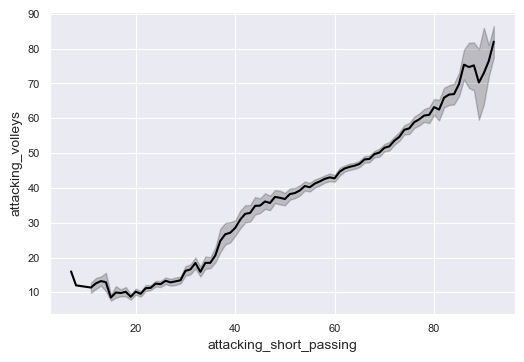

In [28]:
sns.lineplot(x='attacking_short_passing',y='attacking_volleys',data=data,color='black')
plt.show()

* More attacking short passing then the more attacking volleys.
* Less attacking short passing then the less attacking volleys.


### 14. Impact Of Skill Dribbling To Skill Ball Control :-

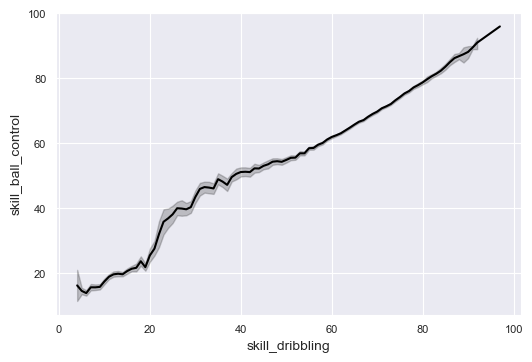

In [29]:
sns.lineplot(x='skill_dribbling',y='skill_ball_control',data=data,color='black')
plt.show()

* If the dribbling skill is more then ball control skill also more.


### 15. Relation Between Skill Curve And Skill FK Accuracy With Respect To Preferred Foot :-

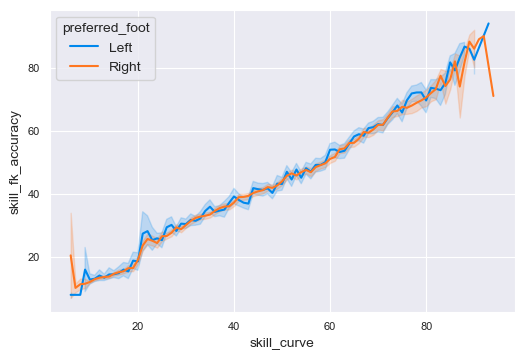

In [30]:
sns.lineplot(x='skill_curve',y='skill_fk_accuracy',data=data,hue='preferred_foot')
plt.show()

* If skill curve is increases then the skill fk accuracy is also increases with both foot.


### 16. Impact Of Skill Long  Passing To Power Long Shots :-

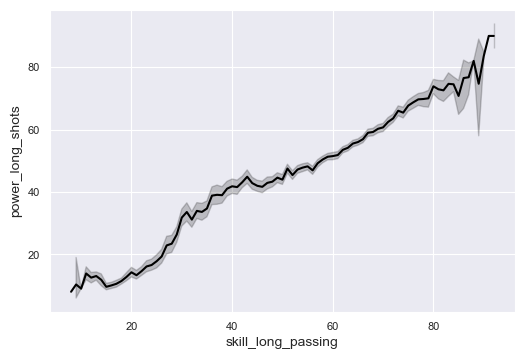

In [31]:
sns.lineplot(x='skill_long_passing',y='power_long_shots',data=data,color='black')
plt.show()

* More skills of long passing then the increase of power long shots.


### 17. Impact Of Movement Sprint Speed To Movement Reaction :-

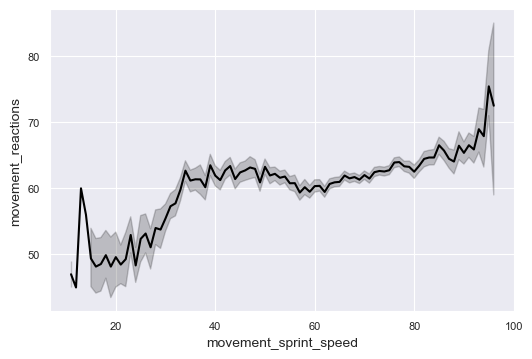

In [32]:
sns.lineplot(x='movement_sprint_speed',y='movement_reactions',data=data,color='black')
plt.show()

* Movement sprint range around 40 to 100 then the movement reaction is constant otherwise fall in both.

### 18.  Impact Of Power Shot To Power Stamina :-

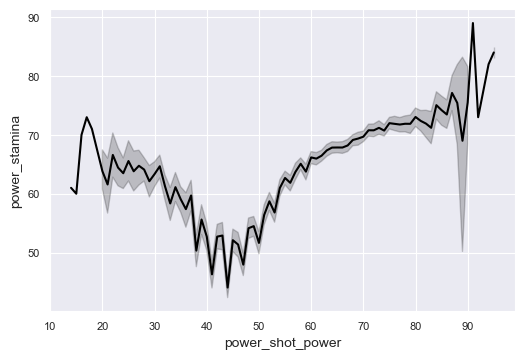

In [33]:
sns.lineplot(x='power_shot_power',y='power_stamina',data=data,color='black')
plt.show()

* If the power shot range around 30 to 60 then the power stamina is decreases
* If the player has more shot power then the stamina is more.


### 19. Impact Of Power Jumping To Power Strength :-

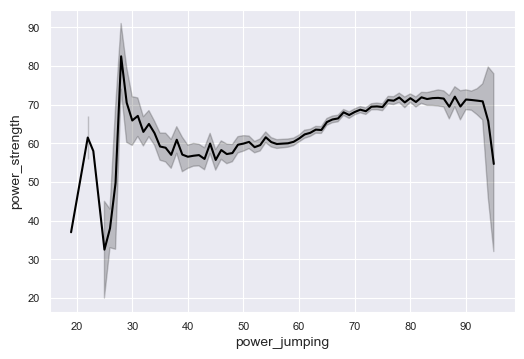

In [34]:
sns.lineplot(x='power_jumping',y='power_strength',data=data,color='black')
plt.show()

* If the power jumping is 30 then the power strength is more and below 30 power jumping less power strength.
* Power jumping above 30 then the power strength is constant.

### 20. Impact To Mentality  Aggression To Mentality Positioning :-

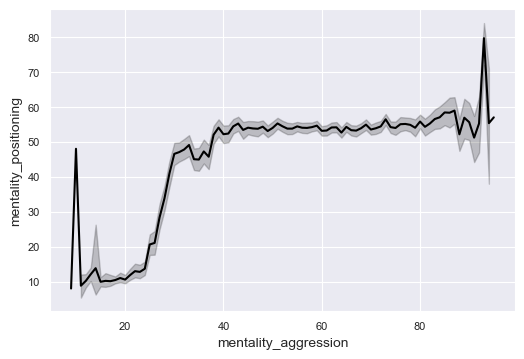

In [35]:
sns.lineplot(x='mentality_aggression',y='mentality_positioning',data=data,color='black')
plt.show()

* If the mentality aggression around 10 to 30 then the mentality positioning is low
* Below 10 mentality aggression the score of mentality positioning is slightly high. otherwise both metality positioning score is constant.


### 21. Impact Of Mentality Penalties To Mentality Vision :-

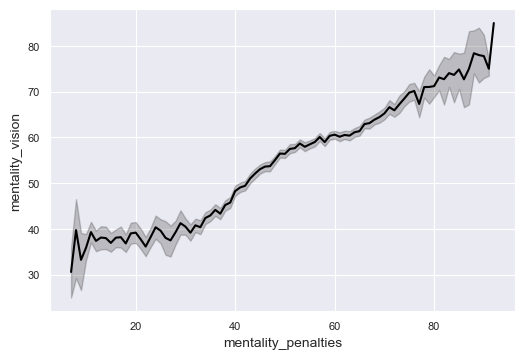

In [36]:
sns.lineplot(x='mentality_penalties',y='mentality_vision',data=data,color='black')
plt.show()

* If the penalties is increases then the mentality vision also increases.


### 22. Relation Between Defending Standing Tackle And Defending Sliding Tackle With Respect To Preferred Foot :-

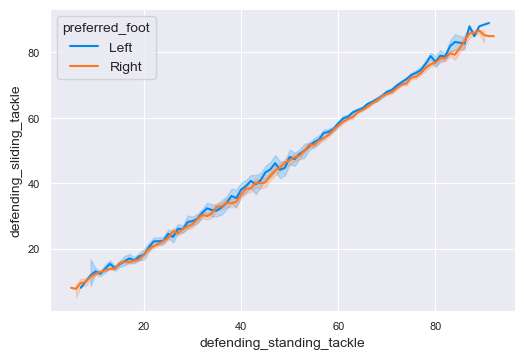

In [37]:
sns.lineplot(x='defending_standing_tackle',y='defending_sliding_tackle',data=data,hue='preferred_foot')
plt.show()

* If defending standing tackle is increases then the defending sliding tackle also increases with both foot.


### Analysis On Categorical Features :-

**1. Impact Of International Reputation To Weak Foot :-**

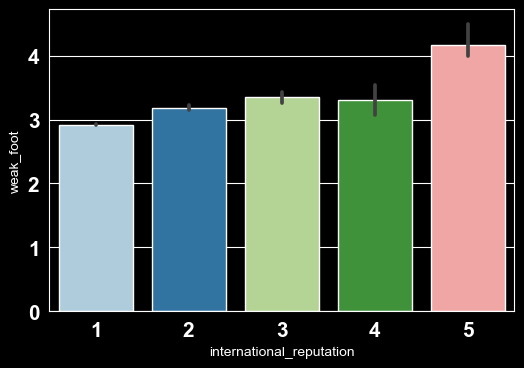

In [38]:
sns.set_style('darkgrid')
plt.style.use("dark_background")
font={'weight' : 'bold',
        'size': 15}
sns.barplot(x='international_reputation',y='weak_foot',data=data,palette="Paired")
plt.xticks(**font)
plt.yticks(**font)
plt.show()

* 5 Intrenational reputation rating of player has more than 4 week foot.
* 1 international reputation rating player has less than 3 weak foot.
* 2, 3, 4 international reputation player has constant weak foot.

**2. Impact Of Work Rate To Skill Moves :-**

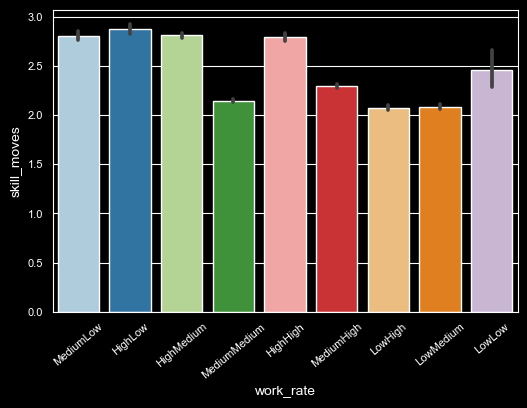

In [39]:
sns.barplot(x='work_rate',y='skill_moves',data=data,palette="Paired")
plt.xticks(rotation=40)
plt.show()

* In this plot cleary seen that 4 types of work rate[medium/low, high/low, high/medium, high/high] has more than 2.5 skill moves.
* Other work rate skill moves is less than 2.5.

**3. Impact Of Real Face To Release Clause Eur :-**

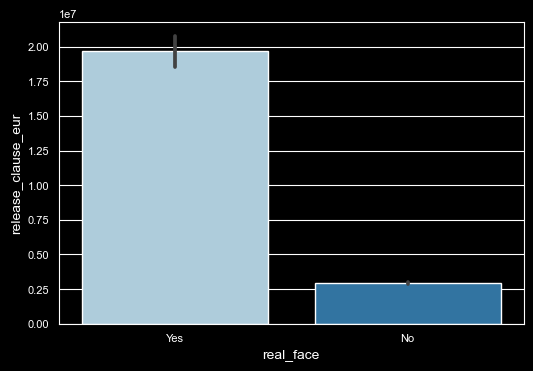

In [40]:
sns.barplot(x='real_face',y='release_clause_eur',data=data,palette="Paired")
plt.show()

* If the player face is real then the release clause is more.
* If the player face is not real then the release clause is less.

**4. Impact Of Preferred Foot To Pace :-**

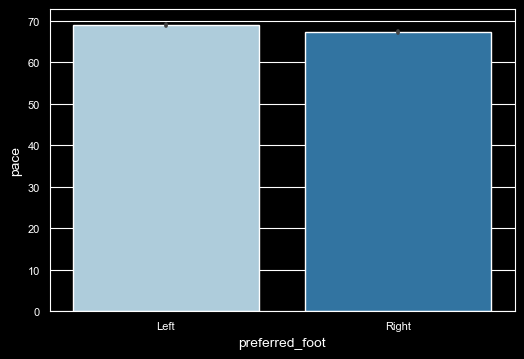

In [41]:
sns.barplot(x='preferred_foot',y='pace',data=data,palette="Paired")
plt.show()

* both left and right preferred foot player pace is same.


**5. Impact Of Team Position To Shooting :-**


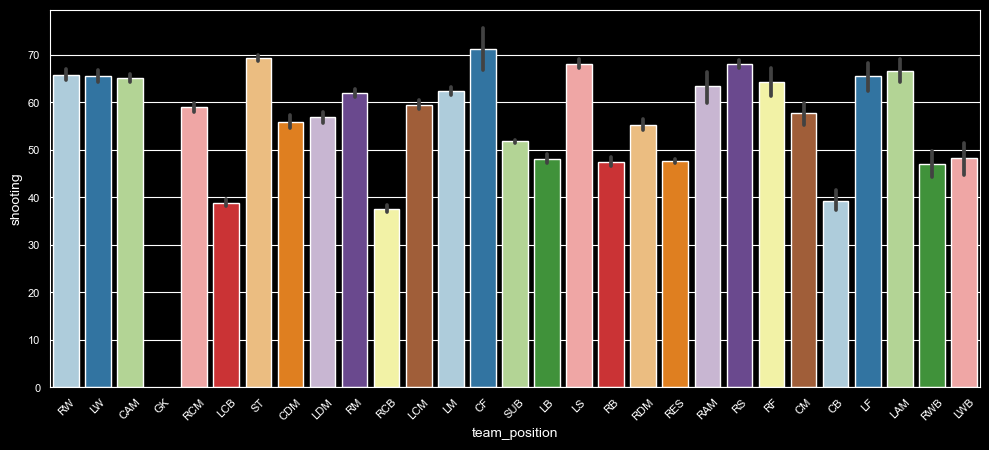

In [42]:
plt.figure(figsize=(12,5))
sns.barplot(x='team_position',y='shooting',data=data,palette="Paired")
plt.xticks(rotation=45)
plt.show()

* In this plot we clearly seent that GK team position has no shooting score.
* CF team position has maximum shooting score.


### Here Some Condition And Plotting

### 1. Top 10 Nationality Player :-

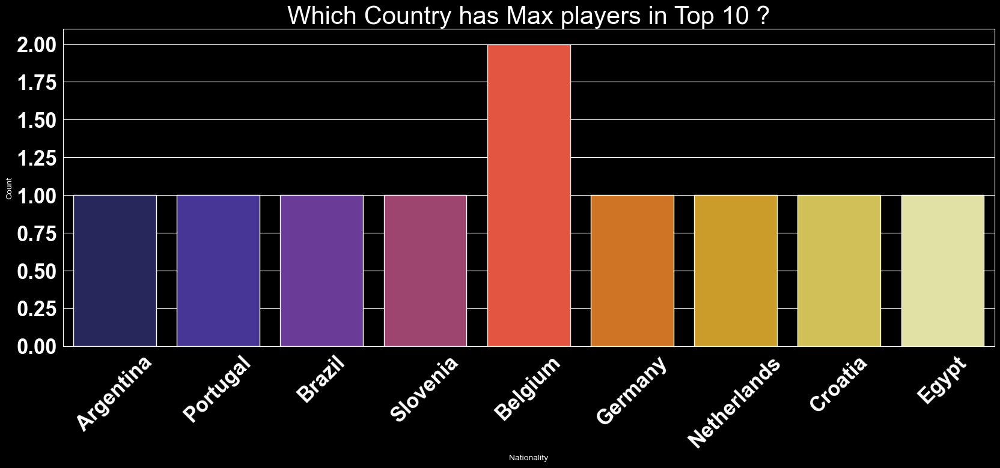

In [43]:
font={'weight' : 'bold',
        'size': 25}
plt.figure(figsize=(20,7))
sns.countplot(x='nationality',data=data.head(10),palette="CMRmap" )

plt.xlabel('Nationality')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.title('Which Country has Max players in Top 10 ?',fontsize = 30,fontweight =20)
plt.xticks(**font)
plt.yticks(**font)
plt.show()

**Most of the belgium country player in to 10**


### 2. Top 10 Club Player :-

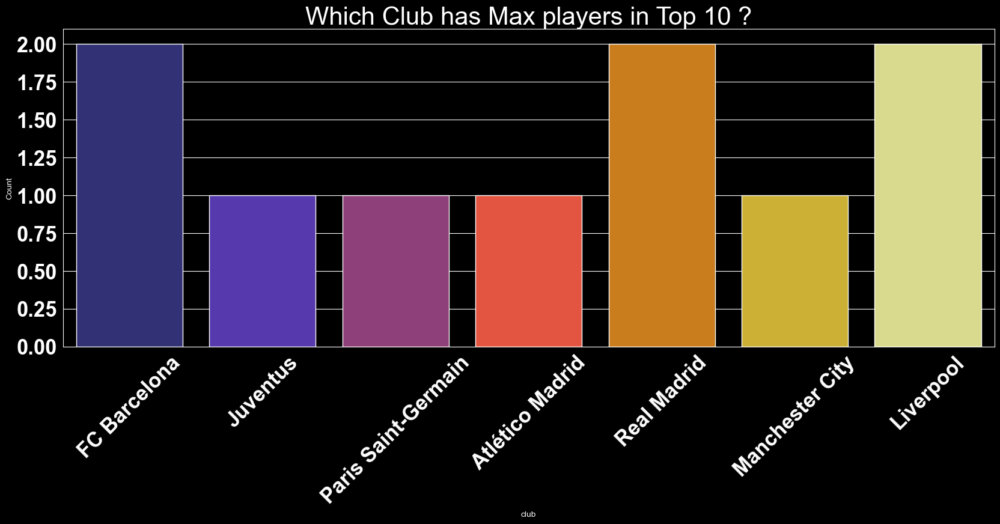

In [44]:
font={'weight' : 'bold',
        'size': 25}
plt.figure(figsize=(20,7))
sns.countplot(x='club',data=data.head(10),palette="CMRmap" )

plt.xlabel('club')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.title('Which Club has Max players in Top 10 ?',fontsize = 30,fontweight =20)
plt.xticks(**font)
plt.yticks(**font)
plt.show()

**Most of the Fc Barcelona. real madrid, and liver pool club player in top 10.**

### 3. Team Position In Top 10 :-

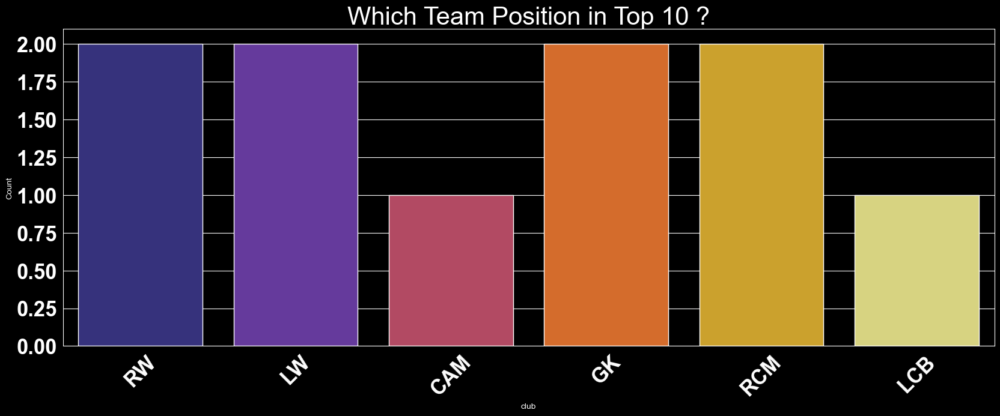

In [45]:
font={'weight' : 'bold',
        'size': 25}
plt.figure(figsize=(20,7))
sns.countplot(x='team_position',data=data.head(10),palette="CMRmap", )

plt.xlabel('club')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.title('Which Team Position in Top 10 ?',fontsize = 30,fontweight =20)
plt.xticks(**font)
plt.yticks(**font)
plt.show()

**Most of the RW, LW, GK, RCM team position in top 10**

### 4. Compare Messi Vs Ronaldo :-


In [46]:
feature = data[['short_name','overall','potential','pace','shooting','passing','dribbling','defending','physic']]
compare = feature.head(2)
compare = compare.set_index('short_name')
compare.head(10)

,overall,potential,pace,shooting,passing,dribbling,defending,physic
short_name,,,,,,,,
L. Messi,94,94,87.0,92.0,92.0,96.0,39.0,66.0
Cristiano Ronaldo,93,93,90.0,93.0,82.0,89.0,35.0,78.0


### 5. Get Top Maximum Value Player With Minimum Release :-

In [47]:
data.sort_values(by=['value_eur','release_clause_eur'],ascending=[0,1]).head()


,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
2,190871,https:sofifa.complayer190871neymar-da-silva-sa...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,HighMedium,Neymar,Yes,195200000.0,"Speedster, Dribbler, Playmaker , Crosser, FK ...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
0,158023,https:sofifa.complayer158023lionel-messi20159586,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,MediumLow,Messi,Yes,195800000.0,"Dribbler, Distance Shooter, Crosser, FK Specia...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
10,231747,https:sofifa.complayer231747kylian-mbappe20159586,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,155000,"ST, RW",Right,3,4,5,HighLow,Normal,Yes,191700000.0,"Speedster, Dribbler, Acrobat",RW,7.0,NaN,2018-07-01,2022.0,RM,10.0,96.0,84.0,78.0,90.0,39.0,75.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Early Crosser, Spe...",78,89,77,82,79,91,79,63,70,90,96,96,92,89,83,83,76,84,76,79,62,38,89,80,70,84,34,34,32,13,5,7,11,6,86,86,86,87,87,87,87,87,86,86,86,86,78,78,78,86,66,62,62,62,66,63,54,54,54,63
5,192985,https:sofifa.complayer192985kevin-de-bruyne201...,K. De Bruyne,Kevin De Bruyne,28,1991-06-28,181,70,Belgium,Manchester City,91,91,90000000,370000,"CAM, CM",Right,4,5,4,HighHigh,Normal,Yes,166500000.0,"Dribbler, Playmaker , Engine, Distance Shoote...",RCM,17.0,NaN,2015-08-30,2023.0,RCM,7.0,76.0,86.0,92.0,86.0,61.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Avoids Using Weaker Foot, Div...",93,82,55,92,82,86,85,83,91,91,77,76,78,91,76,91,63,89,74,90,76,61,88,94,79,91,68,58,51,15,13,5,10,13,82,82,82,87,87,87,87,87,88,88,88,88,87,87,87,88,77,77,77,77,77,73,66,66,66,73
4,183277,https:sofifa.complayer183277eden-hazard20159586,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,HighMedium,Normal,Yes,184500000.0,"Speedster, Dribbler, Acrobat",LW,7.0,NaN,2019-07-01,2024.0,LF,10.0,91.0,83.0,86.0,94.0,35.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Selfish, Finesse Shot, Spee...",81,84,61,89,83,95,83,79,83,94,94,

# DATA PREPROCESSING / FEATURE ENGINEERING :-

## 1. Check Missing Value :-

In [48]:
pd.set_option('display.max_rows',None)
data.isnull().sum()

sofifa_id                         0
player_url                        0
short_name                        0
long_name                         0
age                               0
dob                               0
height_cm                         0
weight_kg                         0
nationality                       0
club                              0
overall                           0
potential                         0
value_eur                         0
wage_eur                          0
player_positions                  0
preferred_foot                    0
international_reputation          0
weak_foot                         0
skill_moves                       0
work_rate                         0
body_type                         0
real_face                         0
release_clause_eur             1298
player_tags                   16779
team_position                   240
team_jersey_number              240
loaned_from                   17230
joined                      

In [49]:
# Create function to check missing value with percentage
def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=['Missing_Number','Missing_Percentage'])
    return null_value
missing_value(data)

,Missing_Number,Missing_Percentage
sofifa_id,0,0.000000
player_url,0,0.000000
short_name,0,0.000000
long_name,0,0.000000
age,0,0.000000
dob,0,0.000000
height_cm,0,0.000000
weight_kg,0,0.000000
nationality,0,0.000000
club,0,0.000000


* **11 Features has more than 50% to 90% missing value and some unique feature also contain missing value so we drop this feature.**
* **Remaining feature missing value is less than 15% so we impute the missing value.**

## 2. Impute Missing Value :-


### Checking The Distribution Before Impute Missing Value :-

**1. Numerical :-**

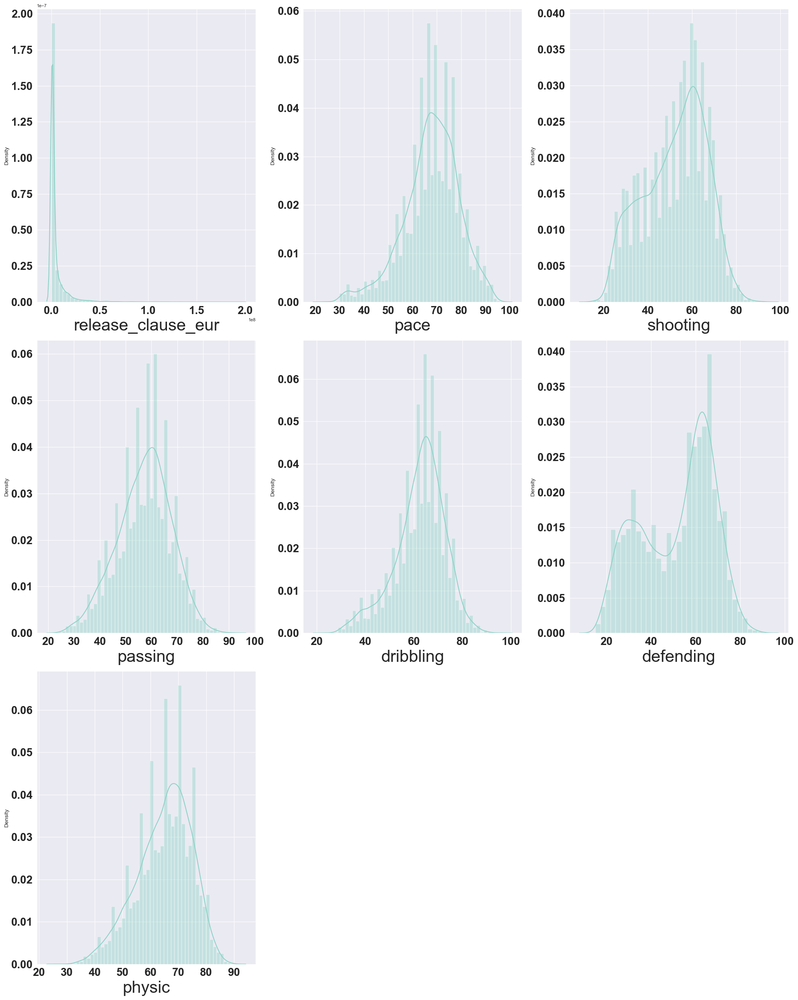

In [50]:
font={'weight' : 'bold',
        'size': 20}

impute_data = data[['release_clause_eur','pace','shooting','passing','dribbling','defending','physic']]
sns.set_style('darkgrid')
plt.figure(figsize=(20,25)) # defining canvas size
plotnum = 1 # counter

for column in impute_data: # iteration of columns / acessing the columns from  dataset 
    if plotnum<=9:    # set the limit
        plt.subplot(3,3,plotnum) # # plotting 7 graphs (3-rows,3-columns) And plotnumber is for count
        sns.distplot(x=impute_data[column]) # Plotting distribution plots 
        plt.xlabel(column,fontsize=30)  # assigning name to x-axis and font size is 30
        plt.xticks(**font)
        plt.yticks(**font)
    plotnum+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction

* Impute missing value using median because disribution is not normal.

In [51]:
data.loc[data['release_clause_eur'].isnull()==True,'release_clause_eur']=data['release_clause_eur'].median()
data.loc[data['pace'].isnull()==True,'pace']=data['pace'].median()
data.loc[data['shooting'].isnull()==True,'shooting']=data['shooting'].median()
data.loc[data['passing'].isnull()==True,'passing']=data['passing'].median()
data.loc[data['dribbling'].isnull()==True,'dribbling']=data['dribbling'].median()
data.loc[data['defending'].isnull()==True,'defending']=data['defending'].median()
data.loc[data['physic'].isnull()==True,'physic']=data['physic'].median()

In [52]:
# Check missing value after imputation
data['release_clause_eur'].isnull().sum()
data['pace'].isnull().sum()
data['shooting'].isnull().sum()
data['passing'].isnull().sum()
data['dribbling'].isnull().sum()
data['defending'].isnull().sum()
data['physic'].isnull().sum()

0

**2. Categorical :-**

In [53]:
data.team_position.value_counts().head()

SUB    7820
RES    2958
GK      662
RCB     660
LCB     660
Name: team_position, dtype: int64

* Impute categorical data using mode(most frequent).

In [54]:
data['team_position'] = data['team_position'].replace(np.nan,'SUB')

In [55]:
data['team_position'].isnull().sum()

0

## 3. Handling Categorical Data :-

**In this data only team_position and preferred_foot feature is impoertant and remaining all feature is unique.**

#### Team Position :-

In [56]:
data.team_position.value_counts()

SUB    8060
RES    2958
GK      662
RCB     660
LCB     660
RB      560
LB      560
ST      458
RCM     411
LCM     411
RM      399
LM      398
CAM     311
RDM     244
LDM     242
RS      195
LS      195
CDM     181
LW      162
RW      161
CB      100
CM       76
RWB      58
LWB      58
RAM      23
LAM      23
RF       19
LF       19
CF       14
Name: team_position, dtype: int64

* manual encoding is best technique to handle categorical feature and Lots of Labels available with the help of map function

In [57]:
data.team_position = data.team_position.map({'SUB':28,'RES':27,'GK':26,'RCB':25,'LCB':24,'RB':23,'LB':22,'ST':21,
                                            'RCM':20,'LCM':19,'RM':18,'LM':17,'CAM':16,'RDM':15,'LDM':14,'RS':13,
                                            'LS':12,'CDM':11,'LW':10,'RW':9,'CB':8,'CM':7,'RWB':6,'LWB':5,'RAM':4,
                                            'LAM':3,'RF':2,'LF':1,'CF':0})

In [58]:
data.team_position.unique()

array([ 9, 10, 16, 26, 20, 24, 21, 11, 14, 18, 25, 19, 17,  0, 28, 22, 12,
       23, 15, 27,  4, 13,  2,  7,  8,  1,  3,  6,  5], dtype=int64)

#### Preferred Foot :-

In [59]:
data.preferred_foot.value_counts()

Right    13960
Left      4318
Name: preferred_foot, dtype: int64

* Right is assign with 1 because of majority and most frequent.
* Left is assign With 0 because of less number. 

In [60]:
data.preferred_foot = data.preferred_foot.map({'Right':1,'Left':0})

In [61]:
data.preferred_foot.value_counts()

1    13960
0     4318
Name: preferred_foot, dtype: int64

## 4. Outlier  Handling :-

**In this data we are handle only important feature outlier, because the remaining feature is unique or some feature is not reuired to handle outlier**

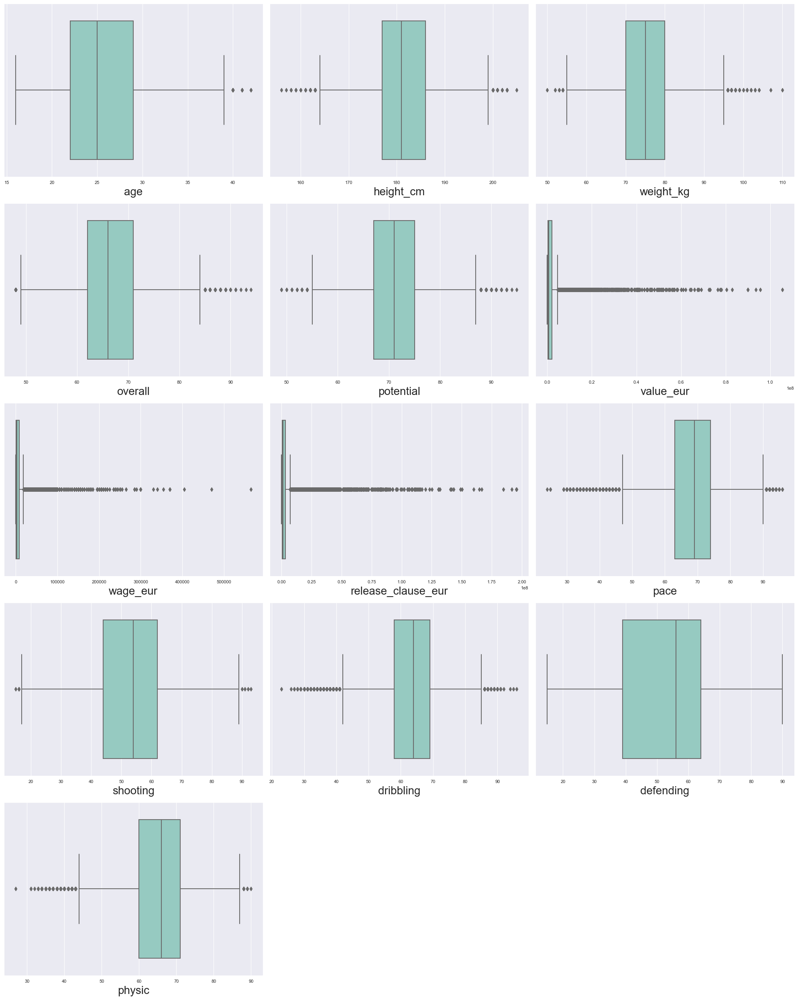

In [62]:
 imp_data = data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur','pace',
           'shooting','dribbling','defending','physic']]

plt.figure(figsize=(20,25)) # defining canvas size
plotnum = 1 # counter

for column in imp_data: # iteration of columns / acessing the columns from  dataset 
    if plotnum<=15:    # set the limit
        plt.subplot(5,3,plotnum) # # plotting 13 graphs (5-rows,3-columns) and plotnumber is for count
        sns.boxplot(x=imp_data[column]) # Plotting box plots 
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotnum+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction

### Checking The Distribution Before Handle The Outlier :-

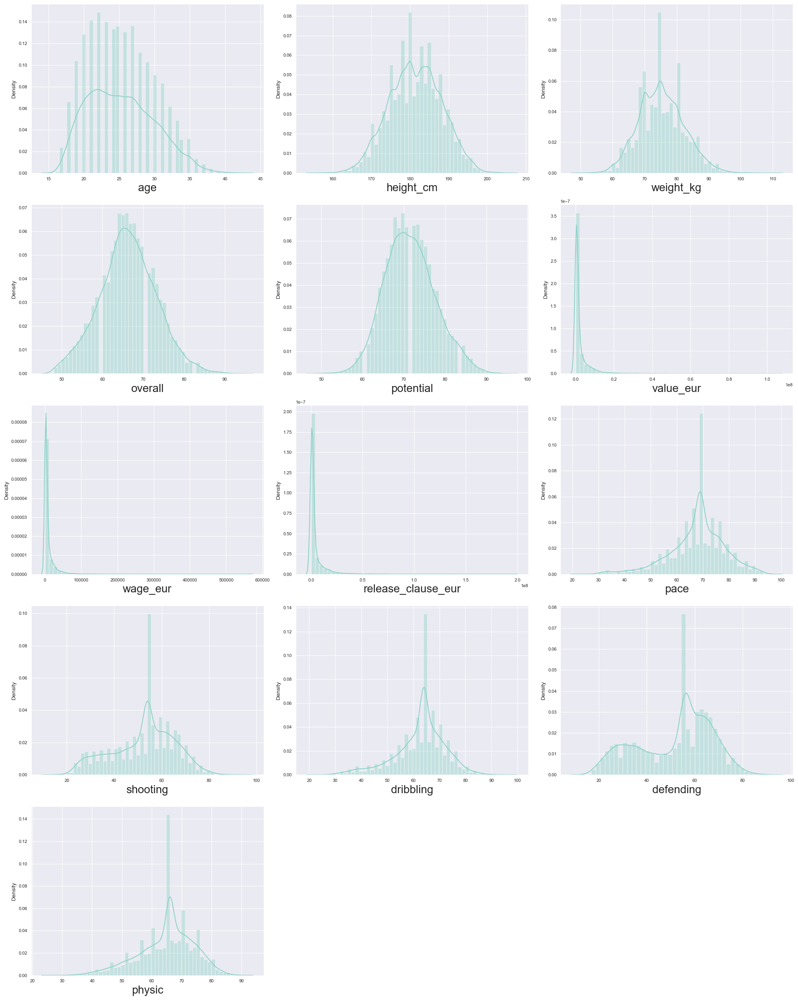

In [63]:
plt.figure(figsize=(20,25)) # defining canvas size
plotnum = 1 # counter

for column in imp_data: # iteration of columns / acessing the columns from  dataset 
    if plotnum<=15:    # set the limit
        plt.subplot(5,3,plotnum) # # plotting 13 graphs (5-rows,3-columns) and plotnumber is for count
        sns.distplot(x=imp_data[column]) # Plotting distribution plots 
        plt.xlabel(column,fontsize=20)  # assigning name to x-axis and font size is 20
    plotnum+=1 # counter increment
plt.tight_layout()
plt.show() # used to hide the storage loction

* Here age,height_cm,weight_kg,overall,potential is follow a normal distribution so we are use Empherical Rule and remaining feature we use Inter Quartile Range (iqr) Rule .

### Empherical Rule :-

#### 1. Age :-

<AxesSubplot:xlabel='age'>

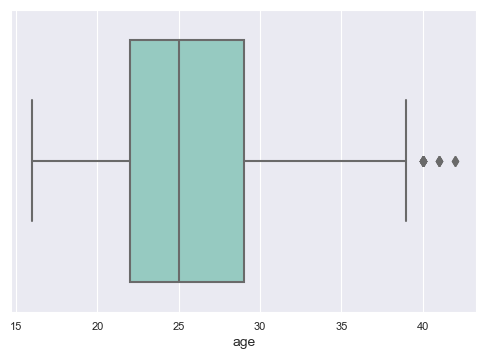

In [64]:
sns.boxplot(x=data.age)

In [65]:
upper_limit = data.age.mean() + 3*data.age.std()
print("Upper limit:",upper_limit)
lower_limit = data.age.mean() - 3*data.age.std()
print("Lower limit:",lower_limit)

Upper limit: 39.25418488202056
Lower limit: 11.312397895088532


In [66]:
len(data.loc[data["age"]> upper_limit])/18278*100

0.10395010395010396

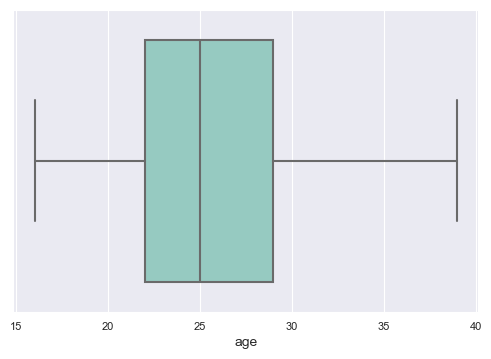

In [67]:
data.loc[data["age"]> upper_limit,"age"] = data["age"].mean()
sns.boxplot(x=data.age)
plt.show()

#### 2.Height CM :- 

<AxesSubplot:xlabel='height_cm'>

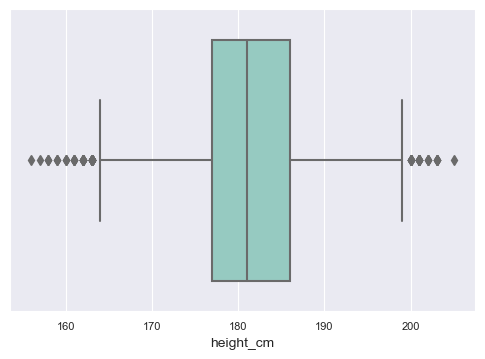

In [68]:
sns.boxplot(x=data.height_cm)

In [69]:
upper_limit = data.height_cm.mean() + 3*data.height_cm.std()
print("Upper limit:",upper_limit)
lower_limit = data.height_cm.mean() - 3*data.height_cm.std()
print("Lower limit:",lower_limit)

Upper limit: 201.6330681374958
Lower limit: 161.09129995529332


In [70]:
len(data.loc[data["height_cm"]> upper_limit])/18278*100

0.06018163912900754

In [71]:
len(data.loc[data['height_cm']< lower_limit])/18278*100

0.0875369296421928

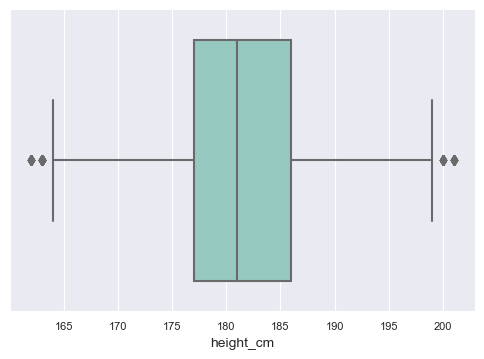

In [72]:
data.loc[data["height_cm"]> upper_limit,"height_cm"] = data["height_cm"].mean()
data.loc[data['height_cm']< lower_limit,'height_cm']=data['height_cm'].mean()
sns.boxplot(x=data.height_cm)
plt.show()

* Outlier is impute but boxplot are show outlier.

#### 3. Weight_KG :-

<AxesSubplot:xlabel='weight_kg'>

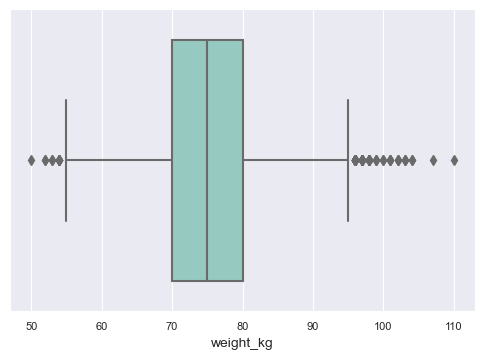

In [73]:
sns.boxplot(x=data.weight_kg)

In [74]:
upper_limit = data.weight_kg.mean() + 3*data.weight_kg.std()
print("Upper limit:",upper_limit)
lower_limit = data.weight_kg.mean() - 3*data.weight_kg.std()
print("Lower limit:",lower_limit)

Upper limit: 96.41957385582987
Lower limit: 54.13311243369853


In [75]:
len(data.loc[data['weight_kg'] < lower_limit])/18278*100 # Lower limit Percentage.

0.06018163912900754

In [76]:
len(data.loc[data['weight_kg'] > upper_limit])/18278*100 # Upper limit percentage.

0.22431338220811906

In [77]:
data.loc[data['weight_kg'] < lower_limit,'weight_kg']=data['weight_kg'].mean()
data.loc[data['weight_kg'] > upper_limit,'weight_kg']=data['weight_kg'].mean()

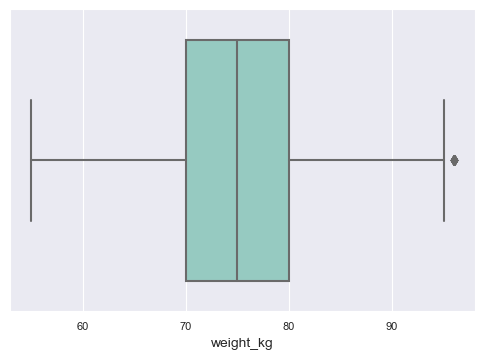

In [78]:
sns.boxplot(x=data.weight_kg)
plt.show()

* Outlier is impute but boxplot are show outlier.

#### 4.Overall :-

<AxesSubplot:xlabel='overall'>

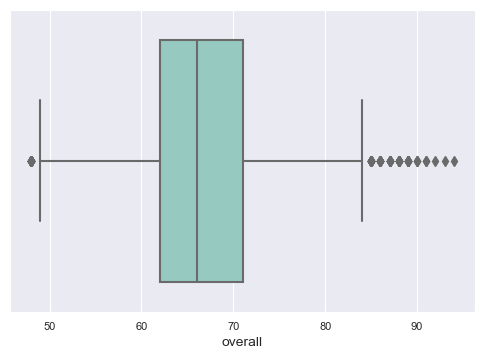

In [79]:
sns.boxplot(x=data.overall)

In [80]:
upper_limit = data.overall.mean() + 3*data.overall.std()
print("Upper limit:",upper_limit)
lower_limit = data.overall.mean() - 3*data.overall.std()
print("Lower limit:",lower_limit)

Upper limit: 87.09485374672605
Lower limit: 45.395134216946126


In [81]:
len(data.loc[data['overall'] < lower_limit])/18278*100 # Lower limit Percentage.

0.0

In [82]:
len(data.loc[data['overall'] > upper_limit])/18278*100 # Upper limit percentage.

0.218842324105482

In [83]:
data.loc[data['overall'] < lower_limit,'overall']=data['overall'].mean()
data.loc[data['overall'] > upper_limit,'overall']=data['overall'].mean()

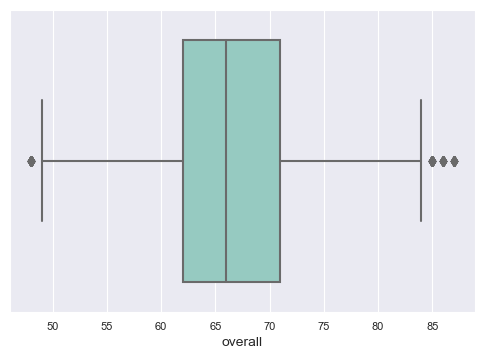

In [84]:
sns.boxplot(x=data.overall)
plt.show()

#### 5. Potential :-

<AxesSubplot:xlabel='potential'>

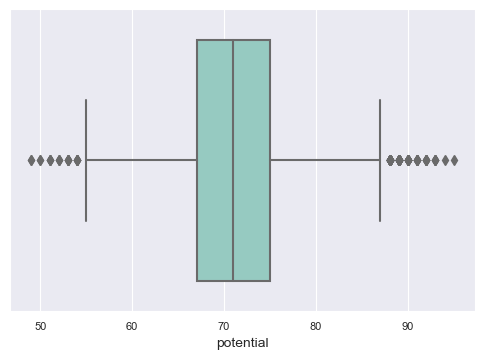

In [85]:
sns.boxplot(x=data.potential)

In [86]:
upper_limit = data.potential.mean() + 3*data.potential.std()
print("Upper limit:",upper_limit)
lower_limit = data.potential.mean() - 3*data.potential.std()
print("Lower limit:",lower_limit)

Upper limit: 89.96589419280835
Lower limit: 53.12787974307086


In [87]:
len(data.loc[data['potential'] < lower_limit])/18278*100 # Lower limit Percentage.

0.09300798774482985

In [88]:
len(data.loc[data['potential'] > upper_limit])/18278*100 # Upper limit percentage.

0.21337126600284498

In [89]:
data.loc[data['potential'] < lower_limit,'potential']=data['potential'].mean()
data.loc[data['potential'] > upper_limit,'potential']=data['potential'].mean()

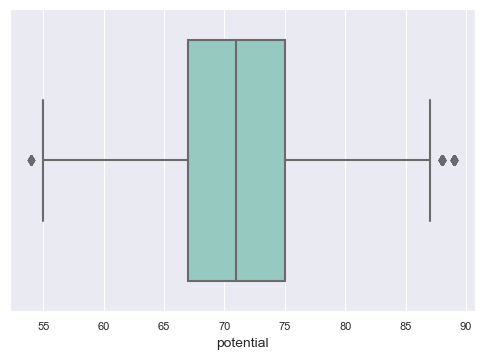

In [90]:
sns.boxplot(x=data.potential)
plt.show()

### Inter Quartile Range (iqr) Rule :-

#### 1. Value Eur :-

<AxesSubplot:xlabel='value_eur'>

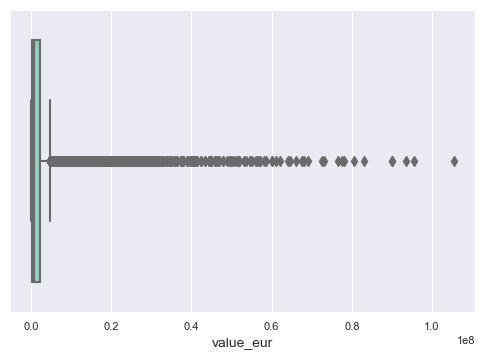

In [91]:
sns.boxplot(x=data.value_eur)

In [92]:
from scipy import stats
IQR = stats.iqr(data.value_eur,interpolation = 'midpoint')
IQR

1775000.0

In [93]:
## min and max limit calculation
# First quartile (Q1) 
Q1 = data.value_eur.quantile(0.25)
# Third quartile (Q3) 
Q3 =data.value_eur.quantile(0.75)
##getting the limits
min_limit= Q1 - 1.5*IQR
print('Minimum limit',min_limit)
max_limit= Q3 +1.5*IQR
print('Maximum limit',max_limit)

Minimum limit -2337500.0
Maximum limit 4762500.0


In [94]:
len(data.loc[data['value_eur'] > max_limit])/18278*100

13.737826895721634

**Here outlier is not less than 5%, so we not impute the outlier**

#### 2. Wage Eur :-

<AxesSubplot:xlabel='wage_eur'>

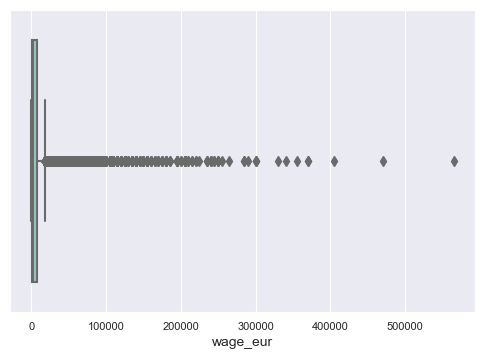

In [95]:
sns.boxplot(x=data.wage_eur)

In [96]:
from scipy import stats
IQR = stats.iqr(data.wage_eur,interpolation = 'midpoint')
IQR

7000.0

In [97]:
## min and max limit calculation
# First quartile (Q1) 
Q1 = data.wage_eur.quantile(0.25)
# Third quartile (Q3) 
Q3 =data.wage_eur.quantile(0.75)
##getting the limits
min_limit= Q1 - 1.5*IQR
print('Minimum limit',min_limit)
max_limit= Q3 +1.5*IQR
print('Maximum limit',max_limit)

Minimum limit -9500.0
Maximum limit 18500.0


In [98]:
len(data.loc[data['wage_eur'] > max_limit])/18278*100

12.911697122223437

**Here also outlier is not less than 5%, so we not impute the outlier**

#### 3. Release Clasuse Eur :-

<AxesSubplot:xlabel='release_clause_eur'>

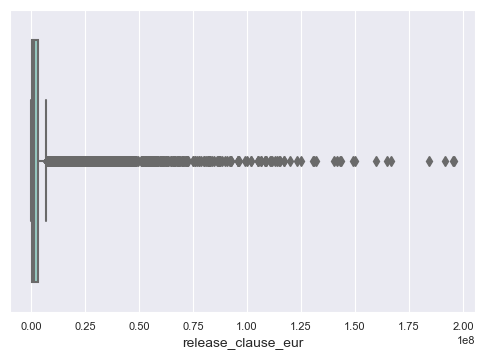

In [99]:
sns.boxplot(data.release_clause_eur)

In [100]:
from scipy import stats
IQR = stats.iqr(data.release_clause_eur,interpolation = 'midpoint')
IQR

2604000.0

In [101]:
## min and max limit calculation
# First quartile (Q1) 
Q1 = data.release_clause_eur.quantile(0.25)
# Third quartile (Q3) 
Q3 =data.release_clause_eur.quantile(0.75)
##getting the limits
min_limit= Q1 - 1.5*IQR
print('Minimum limit',min_limit)
max_limit= Q3 +1.5*IQR
print('Maximum limit',max_limit)

Minimum limit -3310000.0
Maximum limit 7106000.0


In [102]:
len(data.loc[data['release_clause_eur'] > max_limit])/18278*100

15.368202210307475

**Here also outlier is not less than 5%, so we not impute the outlier**

#### 4. Pace :-

<AxesSubplot:xlabel='pace'>

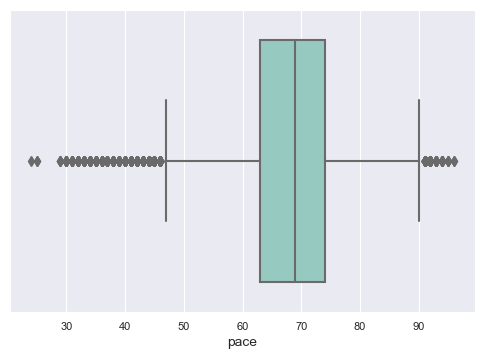

In [103]:
sns.boxplot(x=data.pace)

In [104]:
from scipy import stats
IQR = stats.iqr(data.pace,interpolation = 'midpoint')
IQR

11.0

In [105]:
## min and max limit calculation
# First quartile (Q1) 
Q1 = data.pace.quantile(0.25)
# Third quartile (Q3) 
Q3 =data.pace.quantile(0.75)
##getting the limits
min_limit= Q1 - 1.5*IQR
print('Minimum limit',min_limit)
max_limit= Q3 +1.5*IQR
print('Maximum limit',max_limit)

Minimum limit 46.5
Maximum limit 90.5


In [106]:
len(data.loc[data['pace']> max_limit])/18278*100


1.0285589232957655

In [107]:
len(data.loc[data['pace']< min_limit])/18278*100


4.19083050661998

In [108]:
data.loc[data['pace'] < min_limit,'pace'] = data['pace'].median()
data.loc[data['pace'] > max_limit,'pace'] = data['pace'].median()

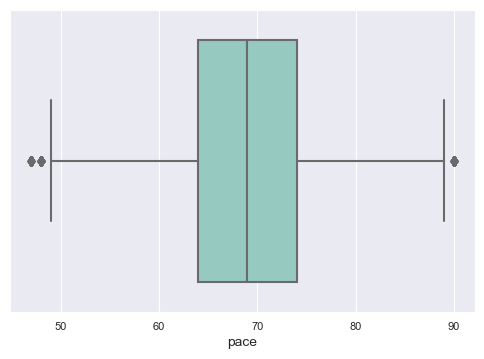

In [109]:
sns.boxplot(x=data.pace)
plt.show()

* There seems more outliers .We can handle them once again.

<AxesSubplot:xlabel='pace', ylabel='Density'>

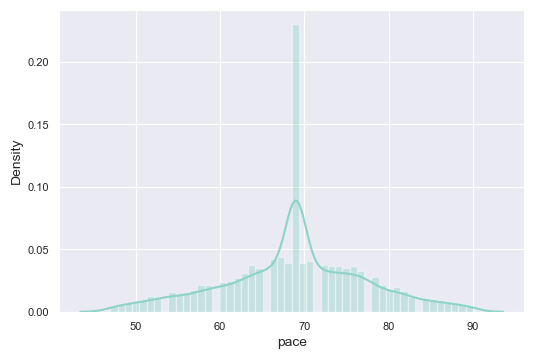

In [110]:
sns.distplot(data.pace)

In [111]:
IQR3 = stats.iqr(data.pace,interpolation = 'midpoint')
IQR3

10.0

In [112]:
Q1 = data.pace.quantile(0.25)
Q3 = data.pace.quantile(0.75)
min_limit = Q1-1.5*IQR3
print('Minimum limit',min_limit)
max_limit = Q3+1.5*IQR3
print('Maximum limit',max_limit)

Minimum limit 49.0
Maximum limit 89.0


In [113]:
data.loc[data['pace'] > max_limit,'pace']=np.median(data.pace)
data.loc[data['pace'] < min_limit,'pace']=np.median(data.pace)


<AxesSubplot:xlabel='pace', ylabel='Density'>

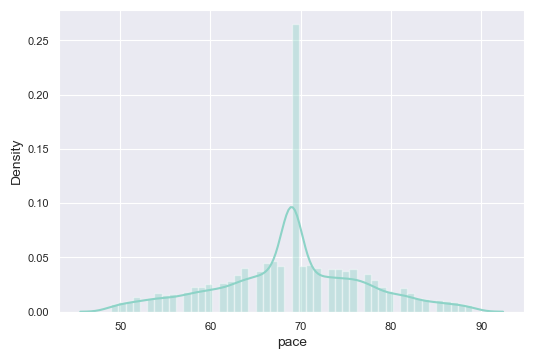

In [114]:
sns.distplot(data.pace)

<AxesSubplot:xlabel='pace'>

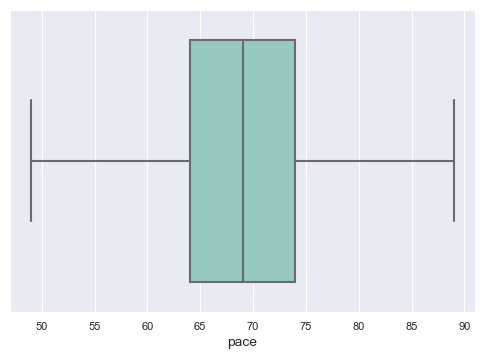

In [115]:
sns.boxplot(x=data.pace)

* Now there is no outliers.

#### 5. Shooting :-

<AxesSubplot:xlabel='shooting'>

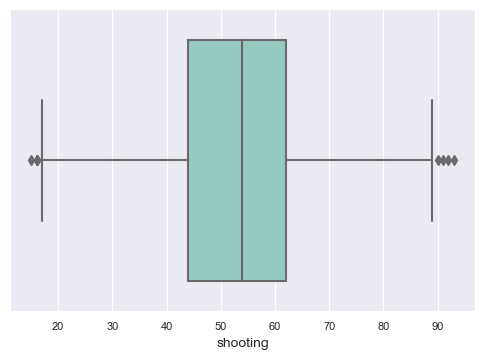

In [116]:
sns.boxplot(x = data.shooting)

In [117]:
from scipy import stats
IQR = stats.iqr(data.shooting,interpolation = 'midpoint')
IQR

18.0

In [118]:
## min and max limit calculation
# First quartile (Q1) 
Q1 = data.shooting.quantile(0.25)
# Third quartile (Q3) 
Q3 =data.shooting.quantile(0.75)
##getting the limits
min_limit= Q1 - 1.5*IQR
print('Minimum limit',min_limit)
max_limit= Q3 +1.5*IQR
print('Maximum limit',max_limit)

Minimum limit 17.0
Maximum limit 89.0


In [119]:
len(data.loc[data['shooting'] < min_limit])/18278*100


0.02735529051318525

In [120]:
len(data.loc[data['shooting'] > max_limit])/18278*100


0.0218842324105482

In [121]:
data.loc[data['shooting'] < min_limit,'shooting'] = data['shooting'].median()
data.loc[data['shooting'] > max_limit,'shooting'] = data['shooting'].median()

<AxesSubplot:xlabel='shooting'>

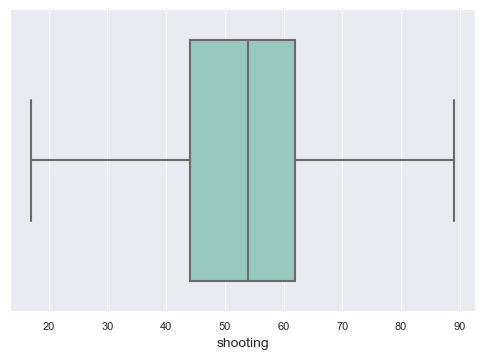

In [122]:
sns.boxplot(x = data.shooting)

* Outlier impute successfully


#### 6. Dribbling :- 

<AxesSubplot:xlabel='dribbling'>

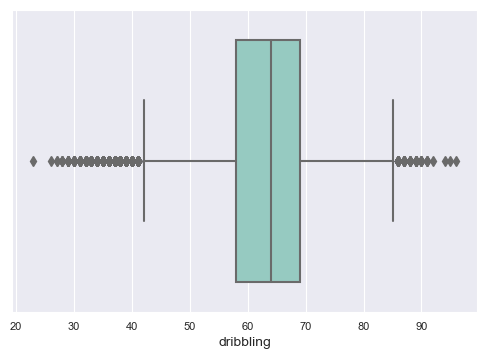

In [123]:
sns.boxplot(x = data.dribbling)

In [124]:
from scipy import stats
IQR = stats.iqr(data.dribbling,interpolation = 'midpoint')
IQR

11.0

In [125]:
## min and max limit calculation
# First quartile (Q1) 
Q1 = data.dribbling.quantile(0.25)
# Third quartile (Q3) 
Q3 =data.dribbling.quantile(0.75)
##getting the limits
min_limit= Q1 - 1.5*IQR
print('Minimum limit',min_limit)
max_limit= Q3 +1.5*IQR
print('Maximum limit',max_limit)

Minimum limit 41.5
Maximum limit 85.5


In [126]:
len(data.loc[data['dribbling'] < min_limit])/18278*100


4.048582995951417

In [127]:
len(data.loc[data['dribbling'] > max_limit])/18278*100


0.4048582995951417

In [128]:
data.loc[data['dribbling'] < min_limit,'dribbling'] = data['dribbling'].median()
data.loc[data['dribbling'] > max_limit,'dribbling'] = data['dribbling'].median()

<AxesSubplot:xlabel='dribbling'>

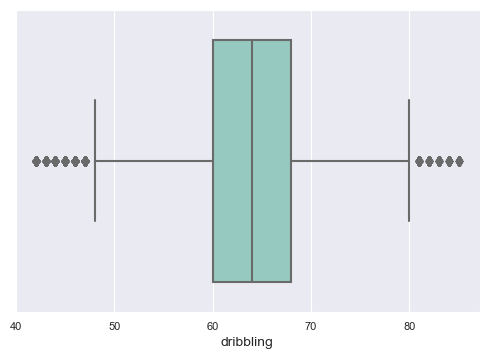

In [129]:
sns.boxplot(x = data.dribbling)

* There seems more outliers .We can handle them once again.

<AxesSubplot:xlabel='dribbling', ylabel='Density'>

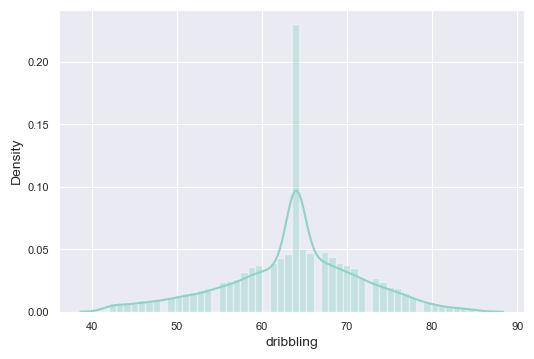

In [130]:
sns.distplot(data.dribbling)

In [131]:
IQR3 = stats.iqr(data.dribbling,interpolation = 'midpoint')
IQR3

8.0

In [132]:
Q1 = data.dribbling.quantile(0.25)
Q3 = data.dribbling.quantile(0.75)
min_limit = Q1-1.5*IQR3
print('Minimum limit',min_limit)
max_limit = Q3+1.5*IQR3
print('Maximum limit',max_limit)

Minimum limit 48.0
Maximum limit 80.0


In [133]:
data.loc[data['dribbling'] > max_limit,'dribbling']=np.median(data.pace)
data.loc[data['dribbling'] < min_limit,'dribbling']=np.median(data.pace)

<AxesSubplot:xlabel='dribbling', ylabel='Density'>

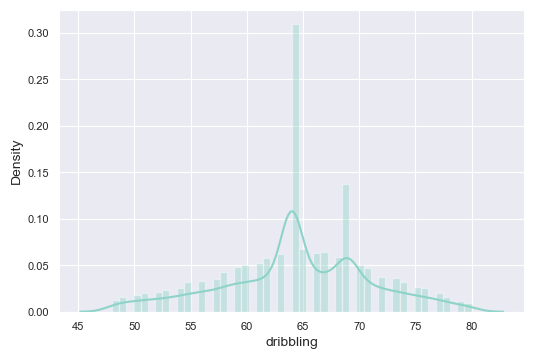

In [134]:
sns.distplot(data.dribbling)

<AxesSubplot:xlabel='dribbling'>

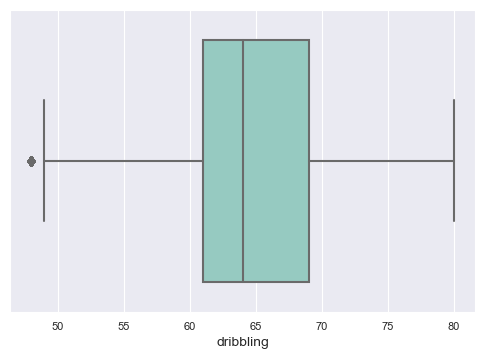

In [135]:
sns.boxplot(x = data.dribbling)

* Outlier is impute successfully, but box plot is show outlier


#### 7. Physic :-

<AxesSubplot:xlabel='physic'>

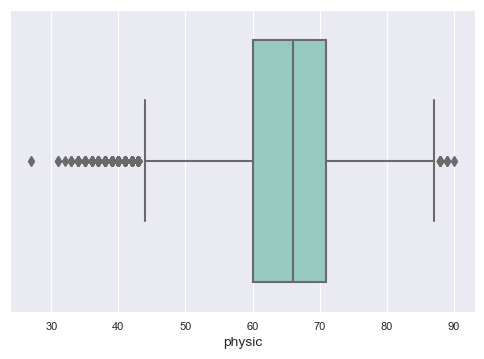

In [136]:
sns.boxplot(x =data.physic)

In [137]:
from scipy import stats
IQR = stats.iqr(data.physic,interpolation = 'midpoint')
IQR

11.0

In [138]:
## min and max limit calculation
# First quartile (Q1) 
Q1 = data.physic.quantile(0.25)
# Third quartile (Q3) 
Q3 =data.physic.quantile(0.75)
##getting the limits
min_limit= Q1 - 1.5*IQR
print('Minimum limit',min_limit)
max_limit= Q3 +1.5*IQR
print('Maximum limit',max_limit)

Minimum limit 43.5
Maximum limit 87.5


In [139]:
len(data.loc[data['physic'] > max_limit])/18278*100

0.0656526972316446

In [140]:
len(data.loc[data['physic'] < min_limit])/18278*100

2.303315461210198

In [141]:
data.loc[data['physic'] < min_limit,'physic'] = data['physic'].median()
data.loc[data['physic'] > max_limit,'physic'] = data['physic'].median()

<AxesSubplot:xlabel='physic'>

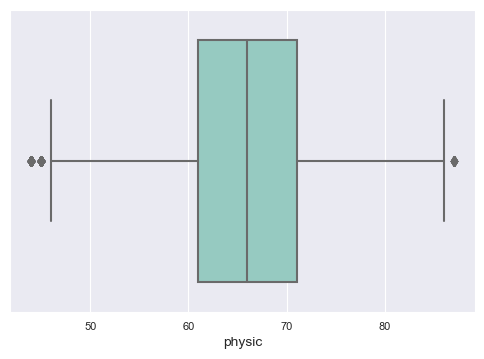

In [142]:
sns.boxplot(x = data.physic)

* There seems more outliers .We can handle them once again.

<AxesSubplot:xlabel='physic', ylabel='Density'>

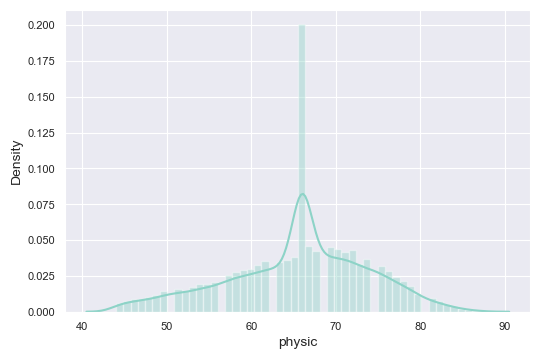

In [143]:
sns.distplot(data.physic)

In [144]:
IQR3 = stats.iqr(data.physic,interpolation = 'midpoint')
IQR3

10.0

In [145]:
Q1 = data.physic.quantile(0.25)
Q3 = data.physic.quantile(0.75)
min_limit = Q1-1.5*IQR3
print('Minimum limit',min_limit)
max_limit = Q3+1.5*IQR3
print('Maximum limit',max_limit)

Minimum limit 46.0
Maximum limit 86.0


In [146]:
data.loc[data['physic'] > max_limit,'physic']=np.median(data.pace)
data.loc[data['physic'] < min_limit,'physic']=np.median(data.pace)

<AxesSubplot:xlabel='physic', ylabel='Density'>

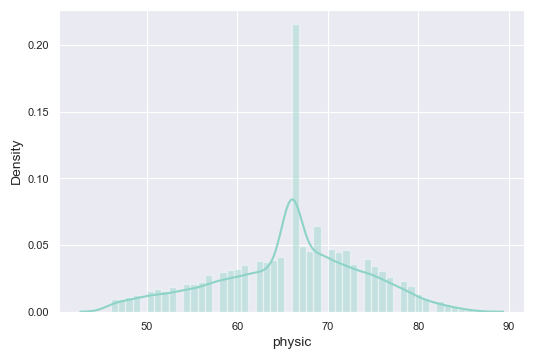

In [147]:
sns.distplot(data.physic)

<AxesSubplot:xlabel='physic'>

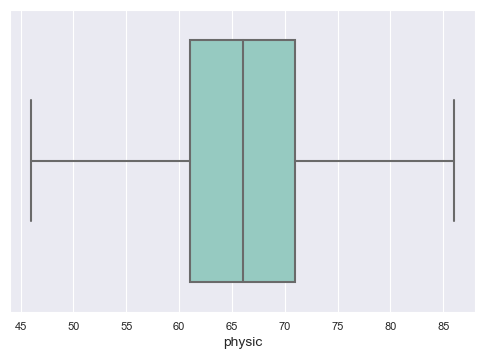

In [148]:
sns.boxplot(x= data.physic)

* Now there is no outliers.

## 5. Feature Scaling :-

### Min-Max Scaling :-
* **Scale down feature between 0 to 1 And Use min max scaling because of dataset contain large amount of outlier so outlier is going to be biased.**

In [149]:
# min max scaling
from sklearn.preprocessing import MinMaxScaler
scale=MinMaxScaler()
data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur',
    'pace','shooting','passing','dribbling','defending','physic','attacking_crossing','attacking_crossing',
    'attacking_finishing','attacking_heading_accuracy','attacking_short_passing','attacking_volleys',
    'skill_dribbling','skill_curve','skill_fk_accuracy','skill_fk_accuracy','skill_long_passing',
    'skill_ball_control','skill_ball_control','movement_acceleration','movement_sprint_speed',
    'movement_agility','movement_reactions','movement_balance','power_shot_power','power_jumping',
    'power_stamina','power_strength','power_long_shots','mentality_aggression','mentality_interceptions',
    'mentality_positioning','mentality_vision','mentality_penalties','mentality_composure','defending_marking',
    'defending_standing_tackle','defending_sliding_tackle','goalkeeping_diving','goalkeeping_handling',
    'goalkeeping_kicking','goalkeeping_positioning',
    'goalkeeping_reflexes']]=scale.fit_transform(data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur',
    'pace','shooting','passing','dribbling','defending','physic','attacking_crossing','attacking_crossing',
    'attacking_finishing','attacking_heading_accuracy','attacking_short_passing','attacking_volleys',
    'skill_dribbling','skill_curve','skill_fk_accuracy','skill_fk_accuracy','skill_long_passing',
    'skill_ball_control','skill_ball_control','movement_acceleration','movement_sprint_speed',
    'movement_agility','movement_reactions','movement_balance','power_shot_power','power_jumping',
    'power_stamina','power_strength','power_long_shots','mentality_aggression','mentality_interceptions',
    'mentality_positioning','mentality_vision','mentality_penalties','mentality_composure','defending_marking',
    'defending_standing_tackle','defending_sliding_tackle','goalkeeping_diving','goalkeeping_handling',
    'goalkeeping_kicking','goalkeeping_positioning',
    'goalkeeping_reflexes']])

In [150]:
data.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https:sofifa.complayer158023lionel-messi20159586,L. Messi,Lionel Andrés Messi Cuccittini,0.695652,1987-06-24,0.205128,0.414634,Argentina,FC Barcelona,0.46782,0.501872,0.905213,1.000000,"RW, CF, ST",0,5,4,4,MediumLow,Messi,Yes,1.000000,"Dribbler, Distance Shooter, Crosser, FK Specia...",9,10.0,NaN,2004-07-01,2021.0,NaN,NaN,0.95,0.513889,1.000000,0.5,0.320000,0.5,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",0.943182,1.000000,0.738636,1.000000,0.977011,1.000000,0.988636,1.000000,1.000000,1.000000,0.929412,0.858824,0.964706,0.986667,0.976471,0.888889,0.644737,0.741176,0.623377,1.000000,0.453488,0.415730,0.989247,1.000000,0.800000,1.000000,0.344086,0.367816,0.264368,0.056180,0.109890,0.152174,0.144444,0.076923,89,89,89,93,93,93,93,93,93,93,93,92,87,87,87,92,68,66,66,66,68,63,52,52,52,63
1,20801,https:sofifa.complayer20801c-ronaldo-dos-santo...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,0.782609,1985-02-05,0.641026,0.682927,Portugal,Juventus,0.46782,0.501872,0.554502,0.716814,"ST, LW",1,5,4,5,HighLow,C. Ronaldo,Yes,0.492816,"Speedster, Dribbler, Distance Shooter, Acrobat...",10,7.0,NaN,2018-07-10,2022.0,LS,7.0,0.50,0.513889,0.852941,0.5,0.266667,0.8,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",0.897727,0.989247,0.954545,0.894118,0.965517,0.913978,0.852273,0.800000,0.821429,0.956044,0.905882,0.941176,0.894118,1.000000,0.694118,1.000000,1.000000,0.858824,0.753247,0.988889,0.627907,0.292135,1.000000,0.858824,0.917647,0.988095,0.290323,0.310345,0.241379,0.067416,0.109890,0.152174,0.144444,0.109890,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61
2,190871,https:sofifa.complayer190871neymar-da-silva-sa...,Neymar Jr,Neymar da Silva Santos Junior,0.478261,1992-02-05,0.333333,0.317073,Brazil,Paris Saint-Germain,0.46782,0.501872,1.000000,0.513274,"LW, CAM",1,5,5,5,HighMedium,Neymar,Yes,0.996935,"Speedster, Dribbler, Playmaker , Crosser, FK ...",16,10.0,NaN,2017-08-03,2022.0,LW,10.0,0.50,0.944444,0.926471,0.5,0.226667,0.3,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",0.931818,0.913978,0.647727,0.941176,0.965517,0.989247,0.931818,0.922222,0.869048,0.989011,0.964706,0.917647,1.000000,0.946667,0.847059,0.814815,0.552632,0.811765,0.376623,0.888889,0.488372,0.370787,0.913978,0.952941,0.976471,0.976190,0.279570,0.241379,0.298851,0.089888,0.087912,0.152174,0.155556,0.109890,84,84,84,90,89,89,89,90,90,90,90,89,82,82,82,89,66,61,61,61,66,61,46,46,46,61
3,200389,https:sofifa.complayer200389jan-oblak20159586,J. Oblak,Jan Oblak,0.434783,1993-01-07,0.666667,0.780488,Slovenia,Atlético Madrid,0.46782,0.501872,0.734597,0.221239,GK,1,3,3,1,MediumMedium,Normal,Yes,0.841154,NaN,26,13.0,N

# FEATURE SELECTION :-

## 1. Drop Unique And Constant Feature :-
* Here we are going to drop unique column as well as lots of missing value column.
* The column ls,st,rs,lw,cf etc.. are playing position in the game and the data in this columns is basically the potential of the player if were to play in that position, so we assume the player only playes with the team position and we will drop this column

In [151]:
data.drop(['sofifa_id','player_url','short_name','long_name','dob','nationality','club','player_positions','body_type',
          'real_face','player_tags','team_jersey_number','loaned_from','joined','contract_valid_until','nation_position',
          'nation_jersey_number','gk_diving','gk_handling','gk_kicking','gk_reflexes','gk_speed','gk_positioning',
          'player_traits','ls','st','rs','lw','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb','ldm',
          'cdm','rdm','rwb','lb','lcb','cb','rcb','rb','lf','work_rate'],axis=1,inplace=True)

In [152]:
data.head(10)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,skill_moves,release_clause_eur,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,0.695652,0.205128,0.414634,0.46782,0.501872,0.905213,1.000000,0,5,4,4,1.000000,9,0.950,0.513889,1.000000,0.50000,0.320000,0.5,0.943182,1.000000,0.738636,1.000000,0.977011,1.000000,0.988636,1.000000,1.000000,1.000000,0.929412,0.858824,0.964706,0.986667,0.976471,0.888889,0.644737,0.741176,0.623377,1.000000,0.453488,0.415730,0.989247,1.000000,0.800000,1.000000,0.344086,0.367816,0.264368,0.056180,0.109890,0.152174,0.144444,0.076923
1,0.782609,0.641026,0.682927,0.46782,0.501872,0.554502,0.716814,1,5,4,5,0.492816,10,0.500,0.513889,0.852941,0.50000,0.266667,0.8,0.897727,0.989247,0.954545,0.894118,0.965517,0.913978,0.852273,0.800000,0.821429,0.956044,0.905882,0.941176,0.894118,1.000000,0.694118,1.000000,1.000000,0.858824,0.753247,0.988889,0.627907,0.292135,1.000000,0.858824,0.917647,0.988095,0.290323,0.310345,0.241379,0.067416,0.109890,0.152174,0.144444,0.109890
2,0.478261,0.333333,0.317073,0.46782,0.501872,1.000000,0.513274,1,5,5,5,0.996935,16,0.500,0.944444,0.926471,0.50000,0.226667,0.3,0.931818,0.913978,0.647727,0.941176,0.965517,0.989247,0.931818,0.922222,0.869048,0.989011,0.964706,0.917647,1.000000,0.946667,0.847059,0.814815,0.552632,0.811765,0.376623,0.888889,0.488372,0.370787,0.913978,0.952941,0.976471,0.976190,0.279570,0.241379,0.298851,0.089888,0.087912,0.152174,0.155556,0.109890
3,0.434783,0.666667,0.780488,0.46782,0.501872,0.734597,0.221239,1,3,3,1,0.841154,26,0.500,0.513889,0.500000,0.50000,0.546667,0.5,0.090909,0.096774,0.113636,0.423529,0.114943,0.086022,0.079545,0.111111,0.380952,0.274725,0.364706,0.576471,0.658824,0.893333,0.435294,0.555556,0.776316,0.341176,0.753247,0.088889,0.290698,0.179775,0.096774,0.658824,0.047059,0.666667,0.279570,0.080460,0.172414,0.966292,1.000000,0.836957,0.988889,0.967033
4,0.521739,0.333333,0.463415,0.46782,0.501872,0.853081,0.831858,1,4,4,4,0.942284,10,0.500,0.916667,0.911765,0.50000,0.266667,0.5,0.863636,0.881720,0.636364,0.964706,0.919540,0.978495,0.875000,0.833333,0.892857,0.978022,0.964706,0.905882,0.988235,0.920000,0.964706,0.839506,0.486842,0.847059,0.558442,0.844444,0.523256,0.426966,0.913978,0.941176,0.952941,0.940476,0.354839,0.252874,0.218391,0.112360,0.120879,0.054348,0.077778,0.076923
5,0.521739,0.487179,0.365854,0.46782,0.501872,0.853081,0.654867,1,4,5,4,0.850348,20,0.675,0.958333,1.000000,0.50000,0.613333,0.8,1.000000,0.860215,0.568182,1.000000,0.908046,0.881720,0.897727,0.877778,0.988095,0.945055,0.764706,0.764706,0.788235,0.933333,0.752941,0.950617,0.578947,0.905882,0.701299,0.955556,0.779070,0.651685,0.924731,1.000000,0.847059,0.940476,0.720430,0.609195,0.551724,0.157303,0.131868,0.043478,0.100000,0.131868
6,0.478261,0.641026,0.731707,0.46782,0.501872,0.639810,0.442478,1,3,4,1,0.732362,26,0.500,0.513889,0.500000,0.50000,0.546667,0.5,0.147727,0.129032,0.068182,0.635294,0.126437,0.182796,0.136364,0.088889,0.654762,0.274725,0.305882,0.458824,0.305882,0.866667,0.364706,0.641975,0.789474,0.270588,0.753247,0.066667,0.395349,0.213483,0.096774,0.717647,0.211765,0.690476,0.258065,0.091954,0.080460,0.977528,0.923077,0.945652,0.966667,0.978022
7,0.478261,0.794872,0.902439,0.46782,0.501872,0.739336,0.353982,1,3,3,2,0.767094,24,0.

## 2. Checking Correlation :-

 **Heatmap:-** 
   *    A heatmap is a graphical representation of data that uses a system of color-coding to represent different values .

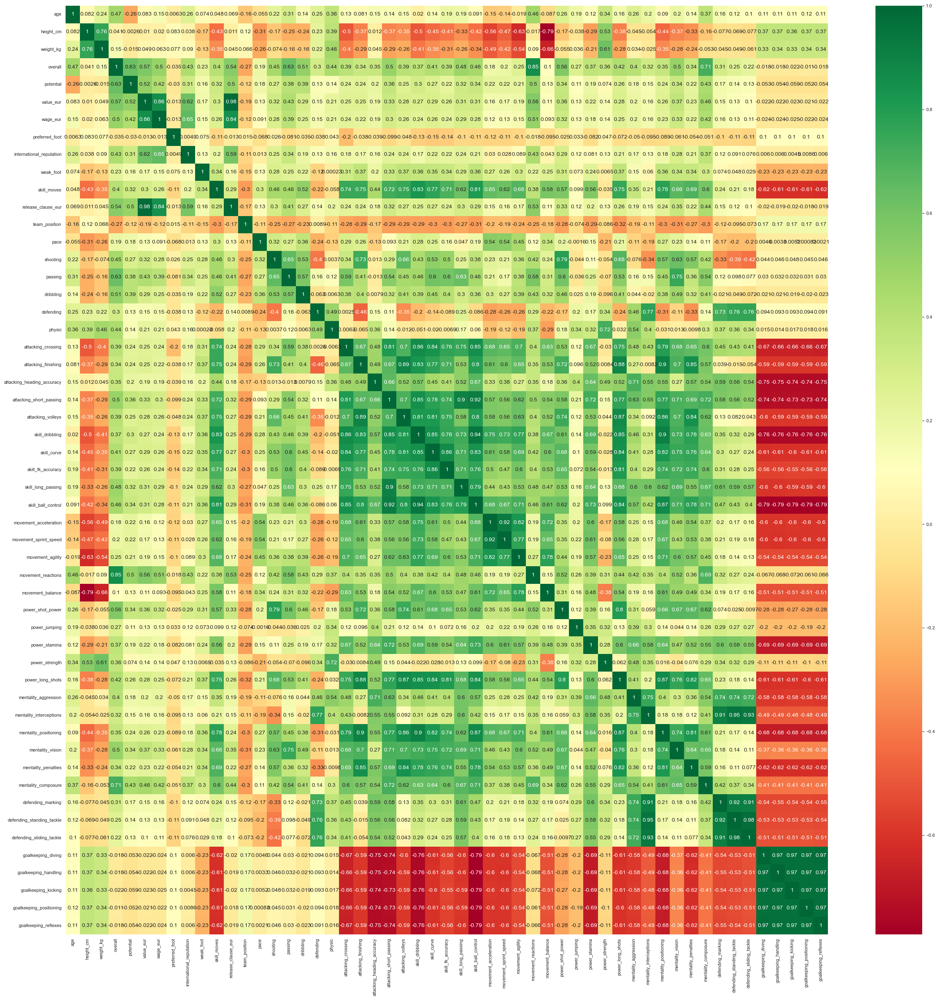

In [153]:
plt.figure(figsize=(30,30))
sns.heatmap(data.corr(),annot=True,cmap='RdYlGn')
plt.show()

* From above heatmap scale we are clearly seen the their is  very difficult to find highly correalted feature in data. 

* So we confirm with the help of simple python code to check the highly correlated feature.

In [154]:
 #To get highly corelated feature 
pd.set_option('display.max_rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat


,feature1,feature2,corr
0,release_clause_eur,value_eur,0.979233
1,value_eur,release_clause_eur,0.979233
2,defending_standing_tackle,defending_sliding_tackle,0.975808
3,defending_sliding_tackle,defending_standing_tackle,0.975808
4,goalkeeping_reflexes,goalkeeping_diving,0.973922
5,goalkeeping_diving,goalkeeping_reflexes,0.973922
6,goalkeeping_diving,goalkeeping_handling,0.971330
7,goalkeeping_handling,goalkeeping_diving,0.971330
8,goalkeeping_reflexes,goalkeeping_handling,0.971244
9,goalkeeping_handling,goalkeeping_reflexes,0.971244


* Here we are going to drop highly correlated feature.

In [155]:
data.drop(['release_clause_eur','defending_standing_tackle','goalkeeping_diving','goalkeeping_handling',
           'goalkeeping_positioning','goalkeeping_reflexes','mentality_interceptions','skill_ball_control',
           'movement_sprint_speed','defending_marking','mentality_positioning','attacking_short_passing'],axis=1,inplace=True)

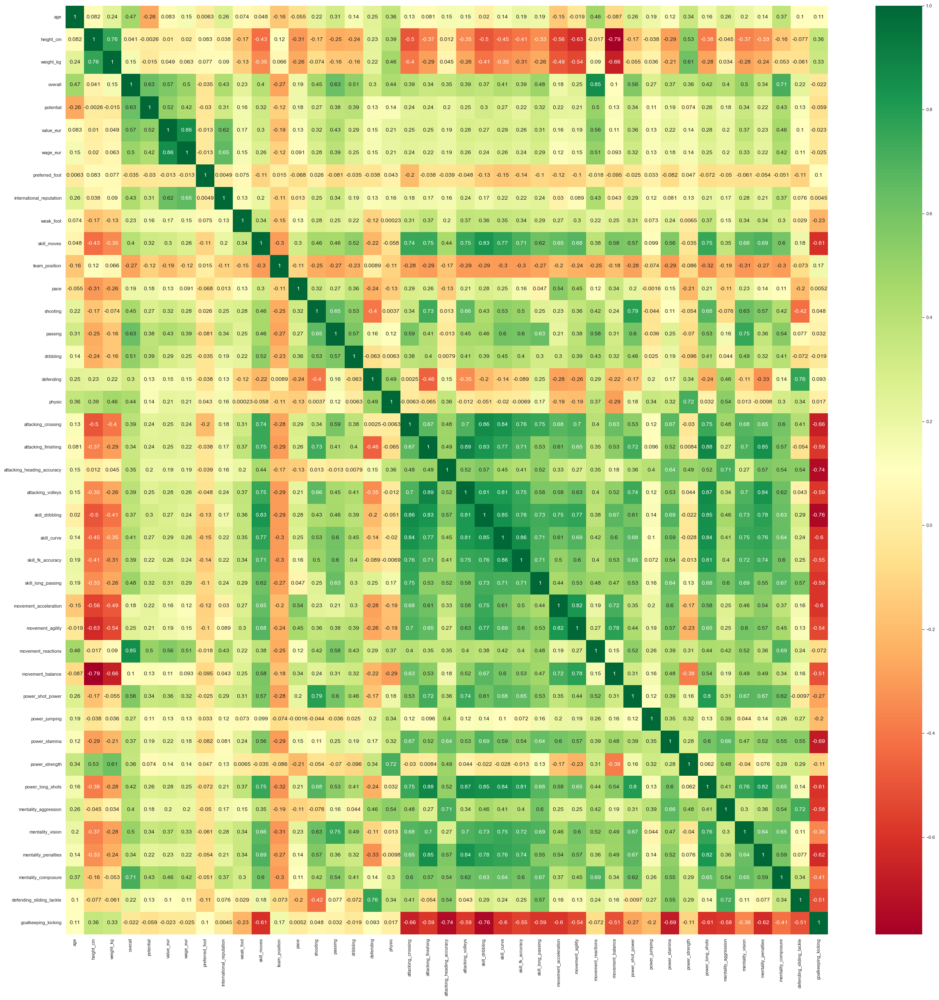

In [156]:
plt.figure(figsize=(30,30))
sns.heatmap(data.corr(),annot=True,cmap='RdYlGn')
plt.show()

*  From above heatmap scale we are clearly seen the their is no highly correlated feature in data.

*  But we confirm with the help of simple code.

In [157]:
pd.set_option('display.max_rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat

,feature1,feature2,corr


* Now we confirm their is no highly correlated feature is present.

## 3. Checking Duplicates :-

In [158]:
data.duplicated().sum()

0

* Their is no Duplicates present in data.

## 4. Principle Component Analysis (PCA) :-

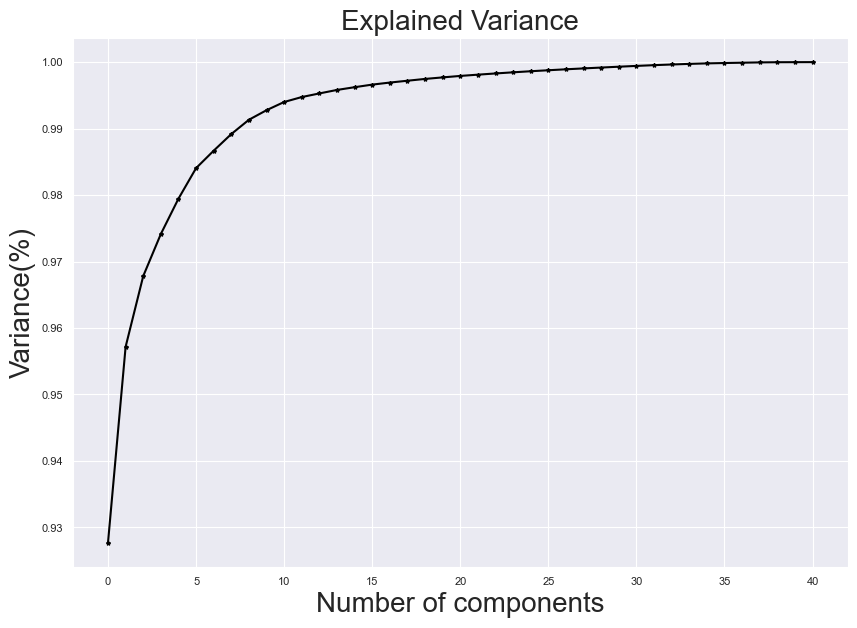

In [159]:
# Step:1 Getting optimal value of pca
from sklearn.decomposition import PCA
pca = PCA() # Object creation
principlecomponents = pca.fit_transform(data) # Fitting the data
plt.figure(figsize=(10,7))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),marker='*',color='k') #plot the variance ratio
plt.xlabel('Number of components',fontsize=20)
plt.ylabel('Variance(%)',fontsize=20) # for each componant
plt.title('Explained Variance',fontsize=20)
plt.show()


In [160]:
pca = PCA(n_components=10)
fifa = pca.fit_transform(data)

# Step:3 Make new dataframe
principle_df = pd.DataFrame(data=fifa,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8','pca9','pca10'])
principle_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10
0,15.460902,2.005286,-0.125093,1.437481,0.325243,2.703364,1.521669,-0.883847,1.262861,-0.118196
1,14.495889,2.535975,-0.102111,1.715518,1.339261,2.089470,1.426116,0.047622,1.654624,-0.095693
2,8.527950,3.395720,-0.933673,1.147930,1.171184,2.303258,1.838705,-0.332742,1.423522,0.207177
3,-1.789745,-1.354213,-0.823453,1.018658,0.686945,1.635719,0.780249,-0.273060,0.184257,-0.261930
4,14.444750,1.814639,-0.368464,0.932738,1.001306,1.729243,1.112703,-0.624321,1.050730,0.050361


# MODEL CREATION :-

## K-MEANS CLUSTERING :-


* Create a cluster on data .

In [168]:
#Step:1 Define independant veriable
X = principle_df
X.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,cluster
0,15.460902,2.005286,-0.125093,1.437481,0.325243,2.703364,1.521669,-0.883847,1.262861,-0.118196,1
1,14.495889,2.535975,-0.102111,1.715518,1.339261,2.089470,1.426116,0.047622,1.654624,-0.095693,1
2,8.527950,3.395720,-0.933673,1.147930,1.171184,2.303258,1.838705,-0.332742,1.423522,0.207177,2
3,-1.789745,-1.354213,-0.823453,1.018658,0.686945,1.635719,0.780249,-0.273060,0.184257,-0.261930,0
4,14.444750,1.814639,-0.368464,0.932738,1.001306,1.729243,1.112703,-0.624321,1.050730,0.050361,1


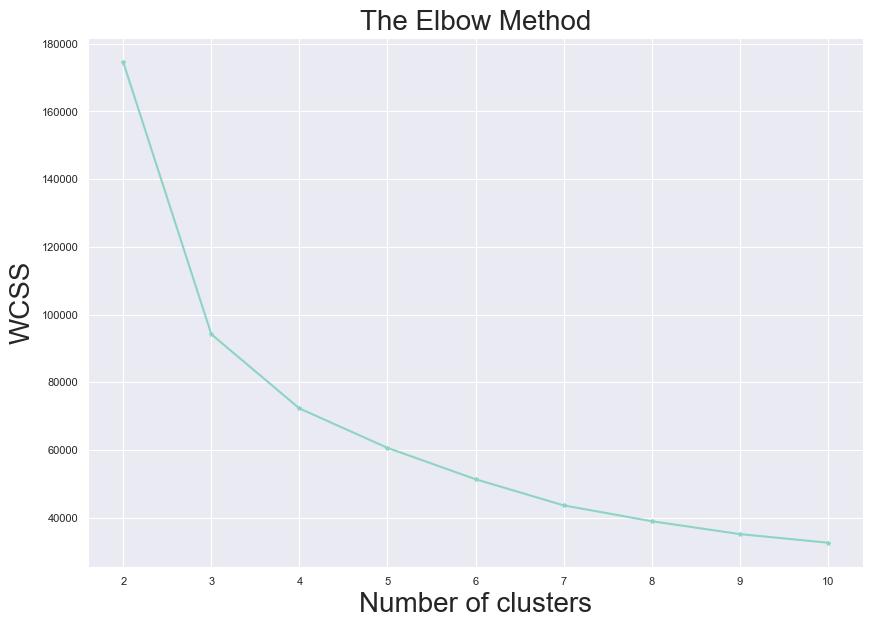

In [169]:
from sklearn.cluster import KMeans
kmeans = KMeans() # Object creation
wcss = [] # Create empty list

for i in range(2,11):
    kmeans = KMeans(n_clusters=i,random_state=42)
    kmeans = kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(10,7))
plt.plot(range(2,11),wcss,marker='*')
plt.title('The Elbow Method',fontsize=20)
plt.xlabel('Number of clusters',fontsize=20)
plt.ylabel('WCSS',fontsize=20)
plt.show()

* From above plot we are select 3 cluster because of odd no and more variance.

In [170]:
# Step:3 initalize the cluster
kmeans = KMeans(n_clusters=3,random_state=45)

# Step:4 Fitting the data
kmeans.fit(X)

# Step:5  Get labels
kmeans.labels_

# Step:6 Print dataset with labels
principle_df['cluster'] = pd.DataFrame(kmeans.labels_)
principle_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,cluster
0,15.460902,2.005286,-0.125093,1.437481,0.325243,2.703364,1.521669,-0.883847,1.262861,-0.118196,1
1,14.495889,2.535975,-0.102111,1.715518,1.339261,2.089470,1.426116,0.047622,1.654624,-0.095693,1
2,8.527950,3.395720,-0.933673,1.147930,1.171184,2.303258,1.838705,-0.332742,1.423522,0.207177,2
3,-1.789745,-1.354213,-0.823453,1.018658,0.686945,1.635719,0.780249,-0.273060,0.184257,-0.261930,0
4,14.444750,1.814639,-0.368464,0.932738,1.001306,1.729243,1.112703,-0.624321,1.050730,0.050361,1


In [171]:
kmeans.cluster_centers_

array([[-3.03257015e+00, -6.91261177e-02, -1.11645176e-02,
         3.55724662e-04,  4.22821413e-03,  3.37606156e-03,
         4.12385571e-03,  9.92053093e-03,  1.15631822e-02,
         1.67654073e-03, -1.65978342e-14],
       [ 1.34760765e+01, -2.36380332e-01, -3.18943386e-02,
        -4.49199462e-04,  3.56622302e-02, -2.07219520e-02,
        -1.33235302e-02,  1.36206148e-03,  4.69605464e-02,
         3.21482449e-03,  1.00000000e+00],
       [ 4.43864210e+00,  3.75436921e-01,  5.74662795e-02,
        -1.09160136e-03, -3.36627512e-02, -2.05557160e-03,
        -8.55971371e-03, -3.74508982e-02, -6.65454776e-02,
        -7.83502532e-03,  2.00000000e+00]])

# MODEL EVALUATION :-

## Silhouette Score :-

* **silhouette score range(-1 to +1).**
* **+1 = Samles are very far from cluster.**
* **0 = Samples close to dicision boundry.**
* **-1 = Samples are assign to wrong cluster.**

In [172]:
# Step:8 Create a new veriable assign to labels
labels = kmeans.labels_
labels

# Step:9 import library to evaluate the model
from sklearn.metrics import silhouette_score
silhou_score = silhouette_score(X,labels)
print("Silhouette Score:",silhou_score)

Silhouette Score: 0.6261836113459515


# CONCLUSION:-

* **3 Cluster silhouette score is 0.6261 .**
* **5 cluster Silhouette Score is 0.5848 .**
* **From the above score of we are select the 3 cluste.**

## CLUSTER :-

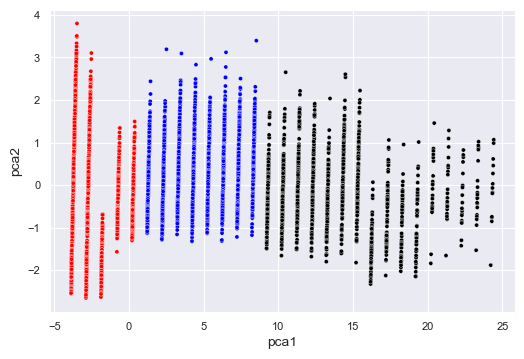

In [173]:
color = np.array(['red','black','blue'])
sns.scatterplot(principle_df.pca1,principle_df.pca2,c=color[kmeans.labels_])
plt.show()

# MODEL SAVING :-

In [174]:
# Model saving using pickle
import pickle
file = open("kmeans_clustering_model.pkl","wb")
pickle.dump(kmeans,file)